 # <center>ADS Project </center>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

## Problem Description

Predicting the price of a stock is a commun field for ml. Our problem setting is to predict the Ethereum Price for the next day, week and month based on its network data is an interesting problem. For that we want to use different Forcasting Methods an want to evaluate them. Also we want to know which of the features are the most relevant ones.

**Problem Statement**:
Predicting the price of a stock is a commun field for ml. 
Our problem setting is to predict the Ethereum Price for the next day, week and month based on its network data is an interesting problem. 
For that we want to use different Forcasting Methods an want to evaluate them. Also we want to know which of the features are the most relevant ones. 

**Target Variable**: Ethereum Price

**Models**:
- Autoregressive Integrated Moving Average (ARIMA)
- LSTM
- Holt Winter’s Exponential Smoothing (HWES) 
- FB Prophet

## 1) Loading & Cleaning the Data

In [2]:
#load Data Functions
def read_data_from_csv(pathInput, columnName, df_list):
    dfColumn = pd.read_csv(pathInputDir + pathInput, delimiter=',', dtype='str', header=0)
    df_list[columnName] = dfColumn
    return df_list

In [3]:
#list of input columns
columns = [
    "MarketCap",
    "AddressCount", 
    "TxGrowth",
    "Difficulty",
    "NetworkHash",
    "NetworkUtilization",
    "TransactionFee",
    "AvgGasPrice",
    "BlockCountReward",
    "BlockSize",
    "BlockTime",
    "Ethersupply",
    "GasLimit",
    "GasUsed",
    "Uncles",
    "BtcPrice"
]

pathInputDir = "../Data Source"

# list of directories of Data
pathDir = [
    "/Currency Information/export-MarketCap.csv",
    "/General Information/export-AddressCount.csv",
    "/General Information/export-TxGrowth.csv",
    "/Network Information/export-BlockDifficulty.csv",
    "/Network Information/export-NetworkHash.csv",
    "/Network Information/export-NetworkUtilization.csv",
    "/Network Information/export-TransactionFee.csv",
    "/Blockchain Information/export-AvgGasPrice.csv",
    "/Blockchain Information/export-BlockCountRewards.csv",
    "/Blockchain Information/export-BlockSize.csv",
    "/Blockchain Information/export-BlockTime.csv",
    "/Blockchain Information/export-Ethersupply.csv",
    "/Blockchain Information/export-GasLimit.csv",
    "/Blockchain Information/export-GasUsed.csv",
    "/Blockchain Information/export-Uncles.csv",
    "/bitcoin/market-price-bitcoin.csv"
]

df_list = {}
for i in range(len(columns)):
    df_list = read_data_from_csv(pathDir[i], columns[i], df_list)
    

In [4]:
# Merging all df from df list


df_list["MarketCap"] = df_list["MarketCap"].drop(columns="MarketCap")

#copy market cap
df_data = df_list["MarketCap"].copy()
#drop timestamp since it's not needed
df_data.drop(columns ="UnixTimeStamp", inplace =True) 

#without marketCap and BtcPrice
for i in range(1,len(columns)-1):
    df_data[columns[i]] = df_list[columns[i]].Value.values
    
# Merging same date from the dfBTCPrice
df_data["BtcPrice"] = df_list["BtcPrice"][1:].sort_index(ascending=False).Price.values

In [5]:
# Move target variables to the end of columns
target_var = df_data["Price"]
df_data = df_data.drop(columns="Price")
df_data["Price"] = target_var

In [6]:
# Converting from str
df_data.replace(',','', inplace=True,regex=True)

df_data1 = df_data.loc[:, df_data.columns != 'Date(UTC)'].astype('float')
df_data['Date(UTC)'] = df_data['Date(UTC)'].astype('datetime64')
df_data.loc[:, df_data.columns != 'Date(UTC)'] = df_data1

df_data.rename(columns={"Date(UTC)": "Date"}, inplace = True)

df_data.head()

,Date,Supply,AddressCount,TxGrowth,Difficulty,NetworkHash,NetworkUtilization,TransactionFee,AvgGasPrice,BlockCountReward,BlockSize,BlockTime,Ethersupply,GasLimit,GasUsed,Uncles,BtcPrice,Price
0,2015-07-30,7.204931e+07,9205.0,8893.0,0.121,11.5297,0.0,0.0,0.0,6912.0,644.0,4.46,39316.09375,0.0,0.0,1299.0,287.0,0.0
1,2015-07-31,7.208550e+07,9361.0,0.0,0.603,51.4594,0.0,0.0,0.0,6863.0,582.0,12.58,36191.71875,0.0,0.0,511.0,283.7,0.0
2,2015-08-01,7.211320e+07,9476.0,0.0,0.887,57.7845,0.0,0.0,0.0,5293.0,575.0,16.34,27705.93750,0.0,0.0,334.0,280.5,0.0
3,2015-08-02,7.214143e+07,9563.0,0.0,1.020,67.9224,0.0,0.0,0.0,5358.0,581.0,16.12,28223.43750,0.0,0.0,394.0,281.4,0.0
4,2015-08-03,7.216940e+07,9639.0,0.0,1.126,74.5737,0.0,0.0,0.0,5280.0,587.0,16.37,27976.71875,0.0,0.0,443.0,281.6,0.0


## 2) Exploratory Data Analysis

In [7]:
df_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 18 columns):
Date                  1500 non-null datetime64[ns]
Supply                1500 non-null float64
AddressCount          1500 non-null float64
TxGrowth              1500 non-null float64
Difficulty            1500 non-null float64
NetworkHash           1500 non-null float64
NetworkUtilization    1500 non-null float64
TransactionFee        1500 non-null float64
AvgGasPrice           1500 non-null float64
BlockCountReward      1500 non-null float64
BlockSize             1500 non-null float64
BlockTime             1500 non-null float64
Ethersupply           1500 non-null float64
GasLimit              1500 non-null float64
GasUsed               1500 non-null float64
Uncles                1500 non-null float64
BtcPrice              1500 non-null float64
Price                 1500 non-null float64
dtypes: datetime64[ns](1), float64(17)
memory usage: 211.0 KB


In [8]:
df_data.describe()

,Supply,AddressCount,TxGrowth,Difficulty,NetworkHash,NetworkUtilization,TransactionFee,AvgGasPrice,BlockCountReward,BlockSize,BlockTime,Ethersupply,GasLimit,GasUsed,Uncles,BtcPrice,Price
count,1.500000e+03,1.500000e+03,1.500000e+03,1500.000000,1500.000000,1500.000000,1.500000e+03,1.500000e+03,1500.000000,1500.00000,1500.000000,1500.000000,1.500000e+03,1.500000e+03,1500.000000,1500.000000,1500.000000
mean,9.213726e+07,2.152700e+07,3.573513e+05,1381.216629,103992.366783,0.468355,3.479465e+20,2.968093e+10,5666.337333,11803.14200,15.364400,23750.603146,5.864147e+06,1.993741e+10,617.044667,4125.926667,204.687733
std,1.072118e+07,2.498827e+07,3.256708e+05,1298.972394,102427.282277,0.372758,4.951416e+20,4.294052e+10,720.416553,9993.41593,2.797517,6437.954850,2.149345e+06,1.830498e+10,370.151816,3947.399550,250.083641
min,7.204931e+07,9.205000e+03,0.000000e+00,0.121000,11.529700,0.000000,0.000000e+00,0.000000e+00,2829.000000,575.00000,4.460000,12869.625000,0.000000e+00,0.000000e+00,126.000000,211.400000,0.000000
25%,8.278264e+07,5.229082e+05,4.175475e+04,59.658250,4471.975825,0.056725,3.404057e+19,1.497751e+10,5234.250000,1523.00000,13.950000,20230.968750,4.009369e+06,1.351073e+09,376.000000,610.250000,10.950000
50%,9.407962e+07,5.975766e+06,3.061815e+05,1444.464500,92156.117400,0.569950,2.910479e+20,2.251696e+10,5946.000000,13026.50000,14.340000,21226.718750,6.715085e+06,1.554304e+10,462.500000,3418.500000,136.045000
75%,1.016003e+08,4.406175e+07,6.285058e+05,2505.067250,179726.672575,0.831900,4.513010e+20,2.688101e+10,6080.000000,20983.25000,16.370000,30987.929688,7.997891e+06,3.956602e+10,774.000000,6721.075000,295.085000
max,1.076359e+08,7.469110e+07,1.349890e+06,3606.036000,295911.997400,0.969000,5.862526e+21,9.395883e+11,6912.000000,36630.00000,30.310000,39316.093750,8.004217e+06,4.936428e+10,2096.000000,19345.500000,1385.020000


In [9]:
# Correlations
df_corr = df_data.corr()
df_corr

,Supply,AddressCount,TxGrowth,Difficulty,NetworkHash,NetworkUtilization,TransactionFee,AvgGasPrice,BlockCountReward,BlockSize,BlockTime,Ethersupply,GasLimit,GasUsed,Uncles,BtcPrice,Price
Supply,1.000000,0.871879,0.843540,0.840346,0.823709,0.905329,0.474226,-0.337491,0.288837,0.870169,-0.187655,-0.792496,0.887071,0.902041,0.332875,0.733790,0.511601
AddressCount,0.871879,1.000000,0.789259,0.766725,0.782175,0.811562,0.380650,-0.233489,0.362446,0.804732,-0.288567,-0.857087,0.813752,0.891032,0.243759,0.651342,0.334379
TxGrowth,0.843540,0.789259,1.000000,0.851423,0.875319,0.936036,0.647129,-0.214922,0.245369,0.965090,-0.197697,-0.808046,0.888451,0.959463,0.634506,0.923400,0.797612
Difficulty,0.840346,0.766725,0.851423,1.000000,0.974904,0.928816,0.539480,-0.234873,0.041182,0.915648,0.019681,-0.788789,0.898953,0.904746,0.557167,0.751845,0.680616
NetworkHash,0.823709,0.782175,0.875319,0.974904,1.000000,0.902719,0.550765,-0.232651,0.214247,0.901368,-0.173559,-0.740443,0.885202,0.928528,0.654439,0.782741,0.702010
NetworkUtilization,0.905329,0.811562,0.936036,0.928816,0.902719,1.000000,0.627518,-0.236102,0.088811,0.975272,-0.017440,-0.859511,0.906912,0.961191,0.535564,0.845872,0.710283
TransactionFee,0.474226,0.380650,0.647129,0.539480,0.550765,0.627518,1.000000,0.076165,0.034146,0.634351,-0.034050,-0.442397,0.542742,0.603379,0.582100,0.645400,0.659227
AvgGasPrice,-0.337491,-0.233489,-0.214922,-0.234873,-0.232651,-0.236102,0.076165,1.000000,-0.193311,-0.220846,0.141051,0.152590,-0.283996,-0.238085,-0.074185,-0.179950,-0.109099
BlockCountReward,0.288837,0.362446,0.245369,0.041182,0.214247,0.088811,0.034146,-0.193311,1.000000,0.110668,-0.966166,0.038047,0.174196,0.292405,0.265952,0.238820,0.018776
BlockSize,0.870169,0.804732,0.965090,0.915648,0.901368,0.975272,0.634351,-0.220846,0.110668,1.000000,-0.046829,-0.854043,0.912690,0.961338,0.573232,0.879677,0.749189


### Data Visualization

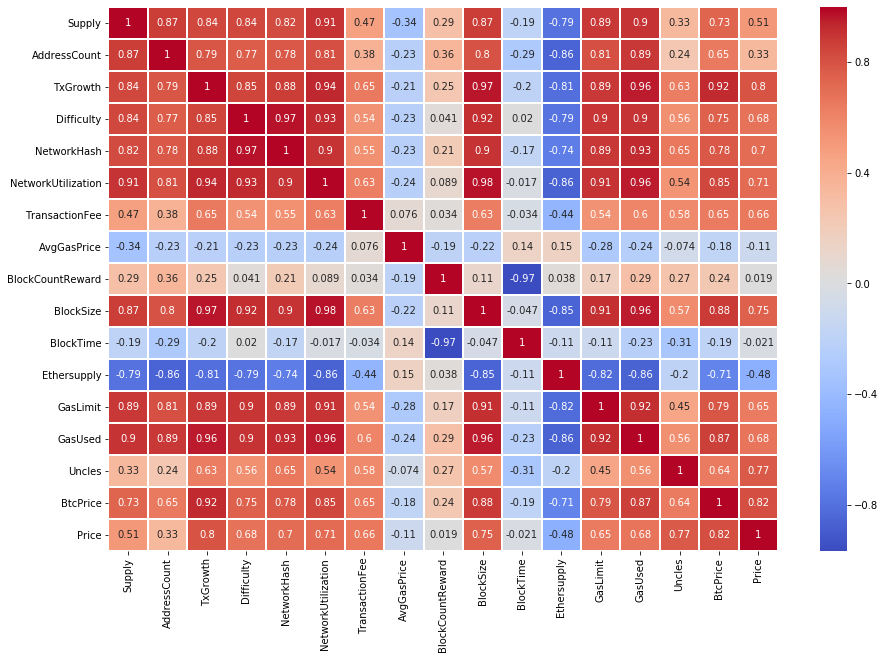

In [10]:
# Visualizations - HeatMap
fig, ax = plt.subplots(figsize=(15,10))
sns.heatmap(df_corr,linecolor='white',linewidth='1',cmap='coolwarm',annot=True)

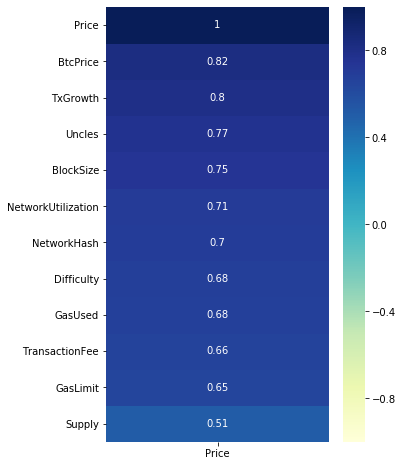

In [11]:
fig1, ax = plt.subplots(figsize=(5,8))
sns.heatmap(df_data.corr()[['Price']].sort_values('Price').tail(12),vmax=1, vmin=-1, cmap='YlGnBu', annot=True, ax=ax);
ax.invert_yaxis()

In [12]:
def chunkIt(seq, num):
    avg = len(seq) / float(num)
    out = []
    last = 0.0

    while last < len(seq):
        out.append(seq[int(last):int(last + avg)])
        last += avg

    return out

a = chunkIt(df_data.columns.values, 4)

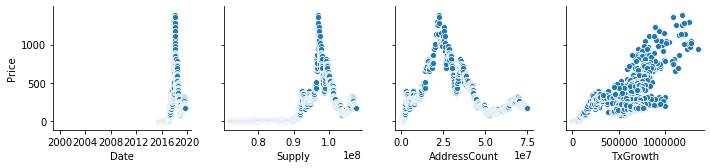

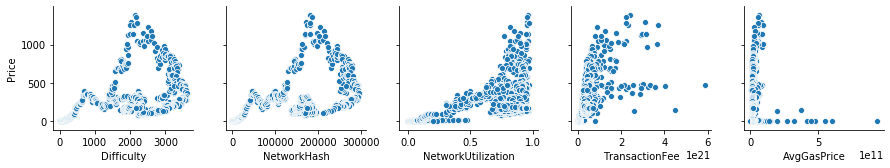

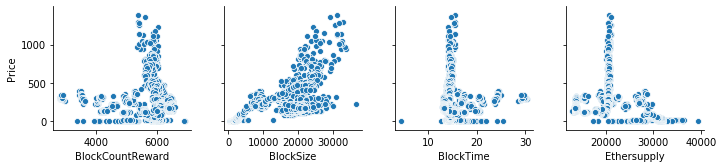

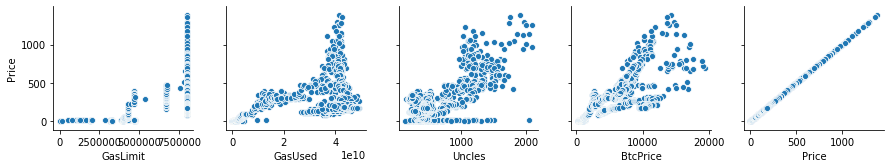

In [13]:
for column in a:
    sns.pairplot(data=df_data,
                      y_vars=['Price'],
                      x_vars= column)
    plt.show()

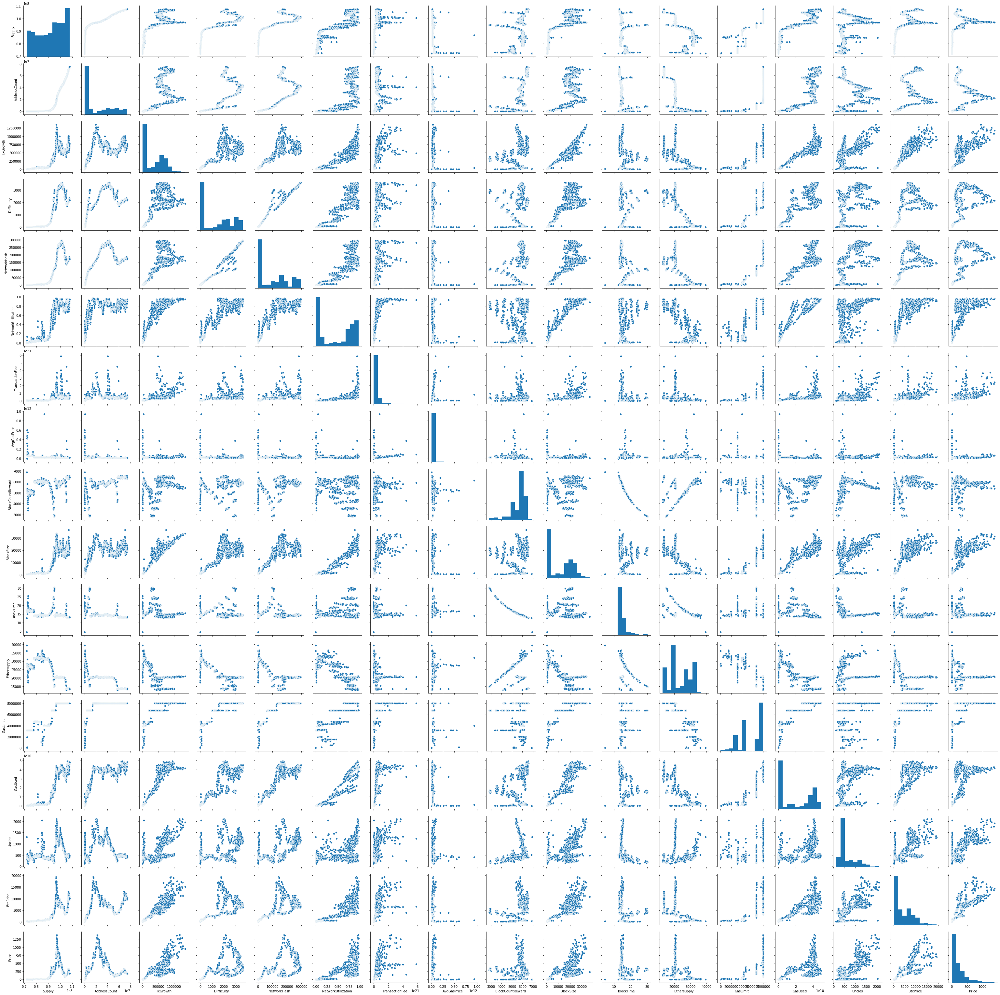

In [14]:
# Visualizations - PairPlot
sns.pairplot(df_data)
plt.show()

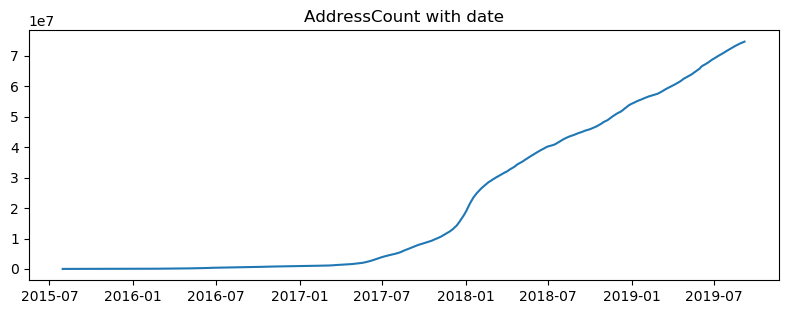

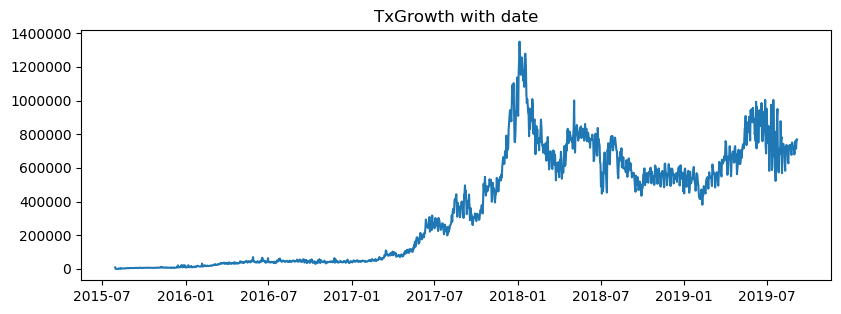

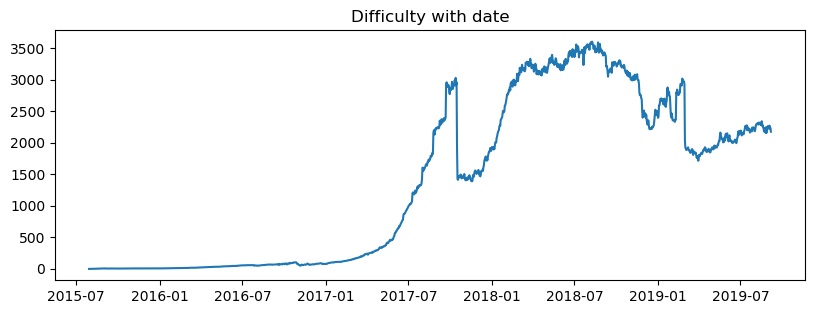

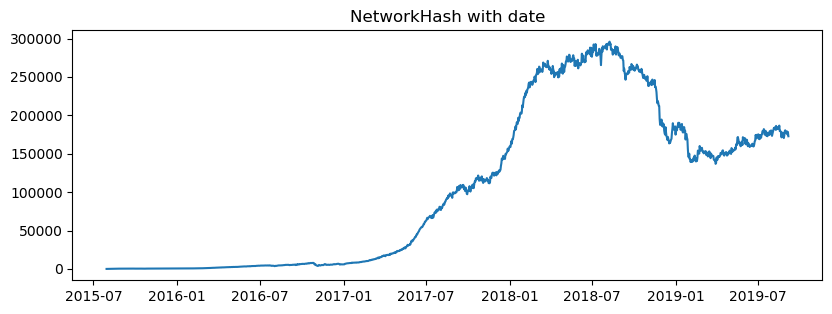

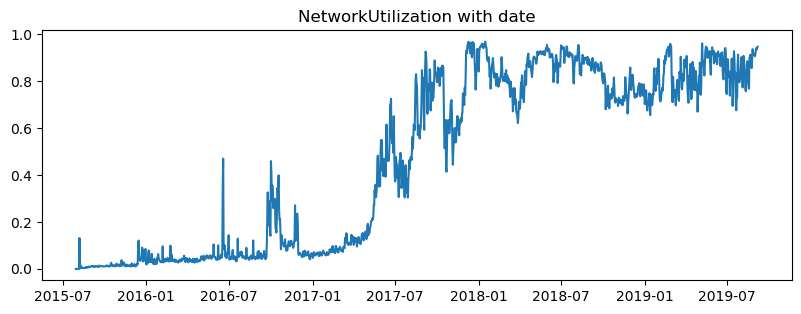

...

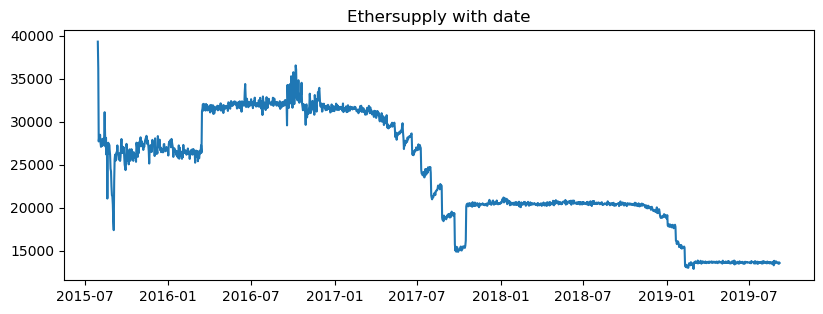

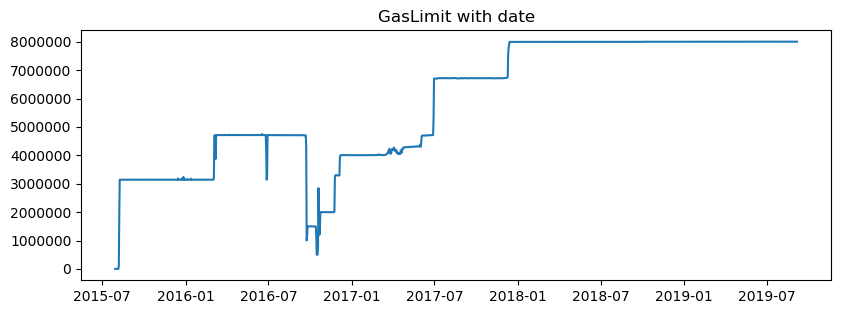

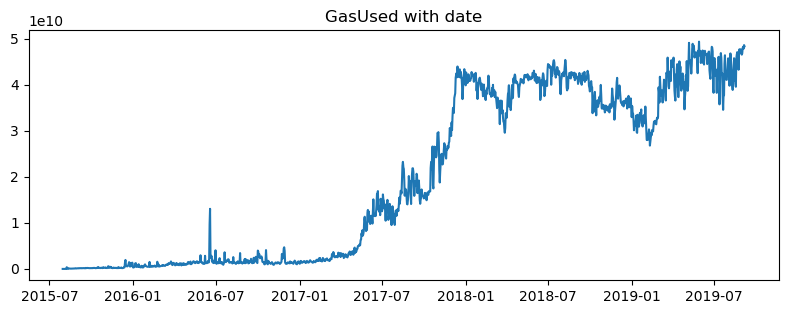

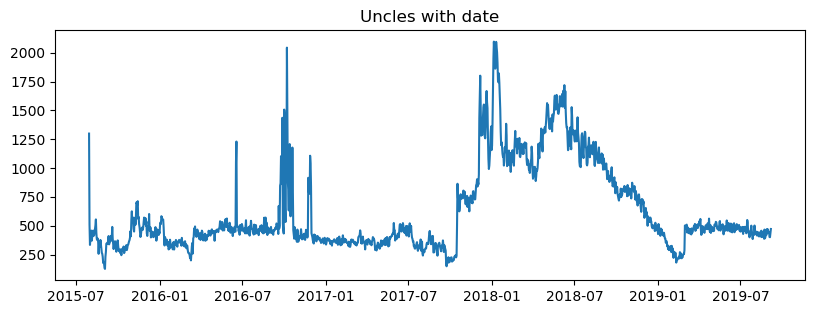

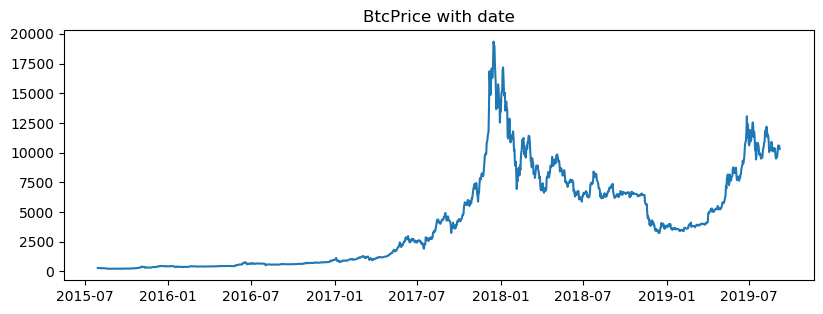

In [15]:
# Visualizations
x = df_data["Date"]

for element in columns[1:]:
    plt.show()
    y = df_data[element]
    fig = plt.figure(figsize = (15,5), dpi=100)
    axes = fig.add_axes([0.5,0.5,0.5,0.5])
    axes.plot(x,y)
    axes.set_title(element+" with date")

plt.show()

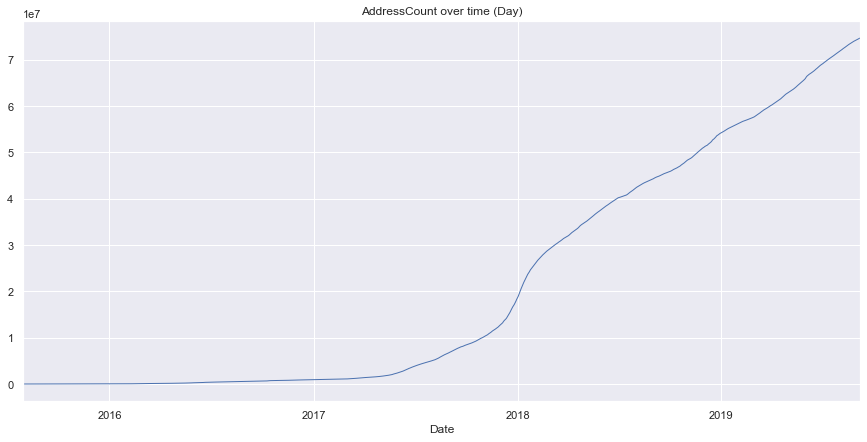

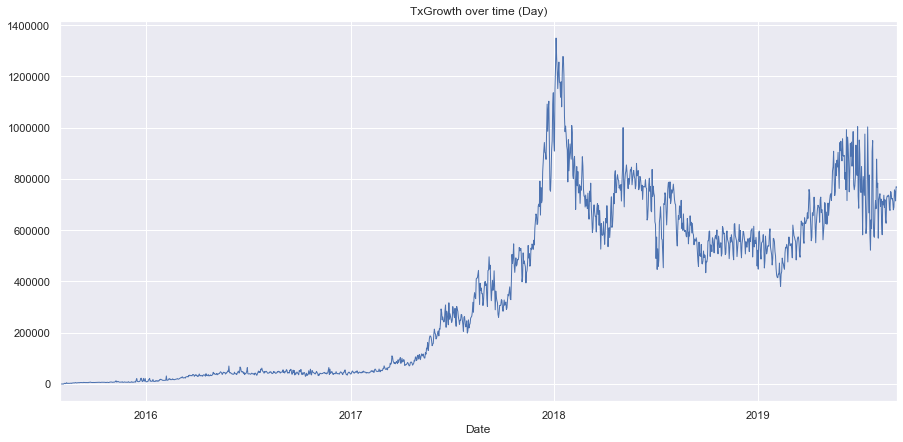

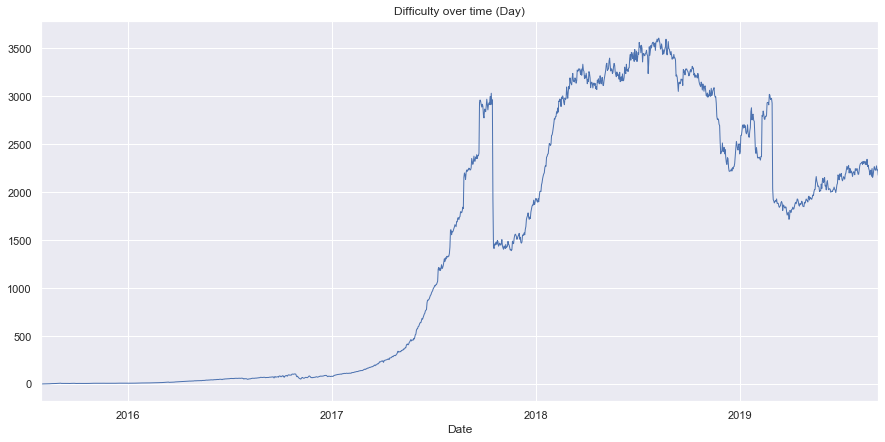

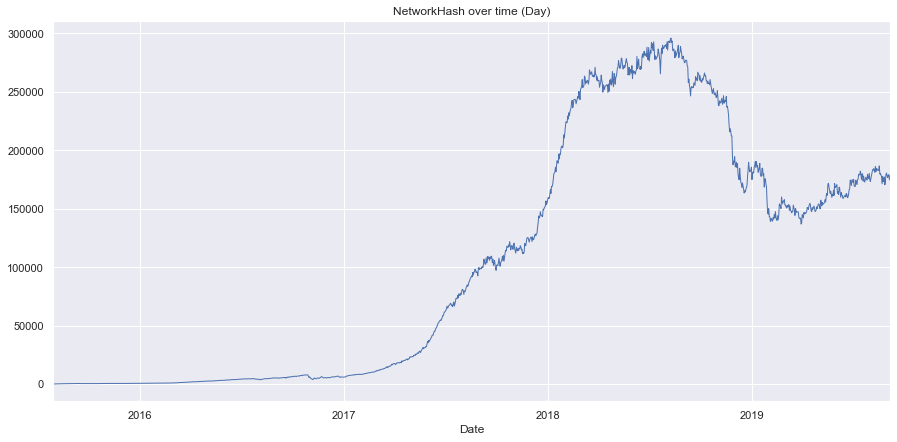

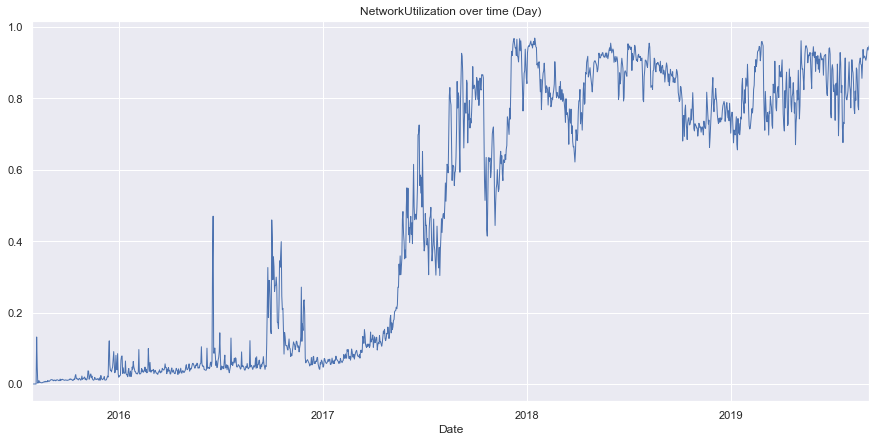

...

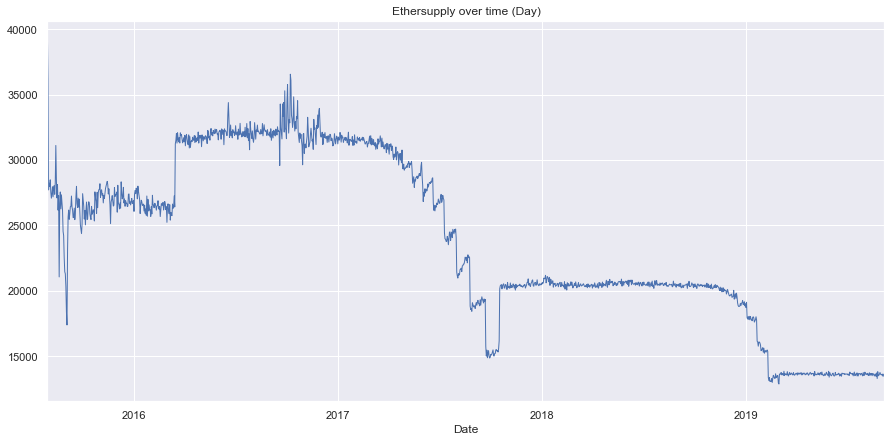

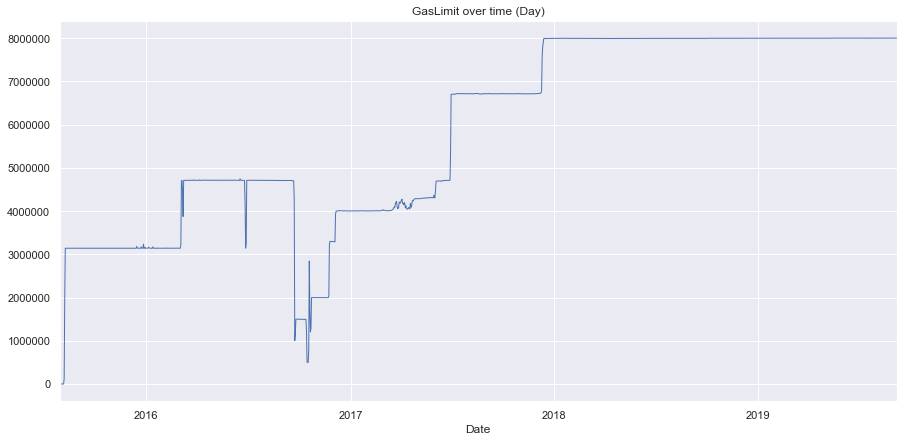

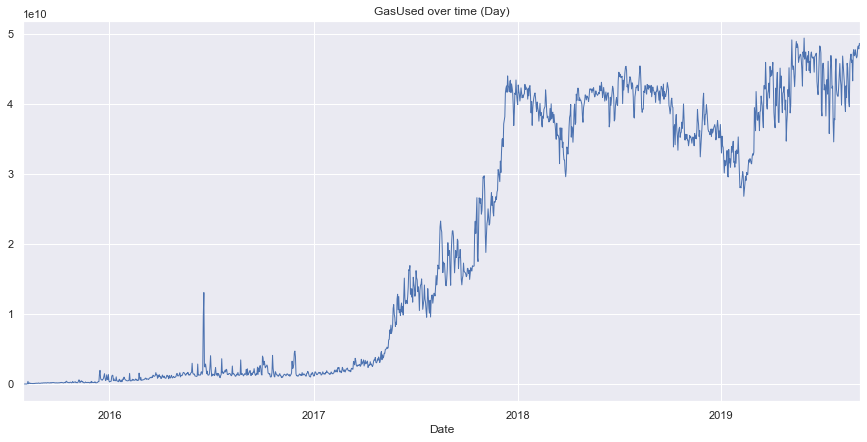

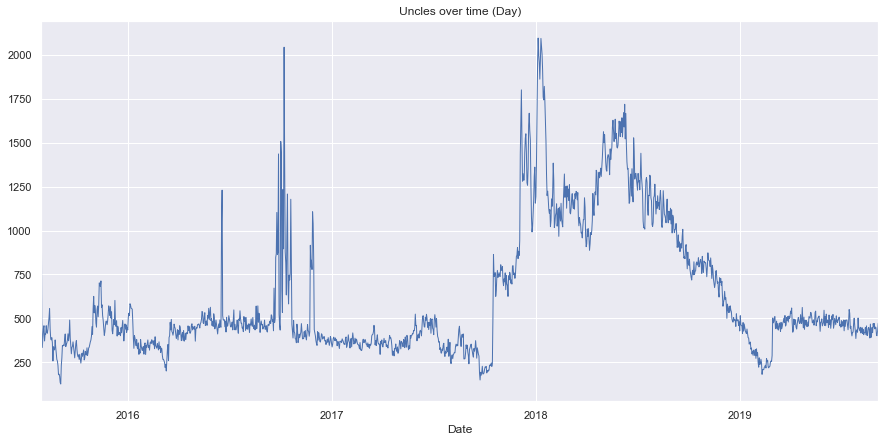

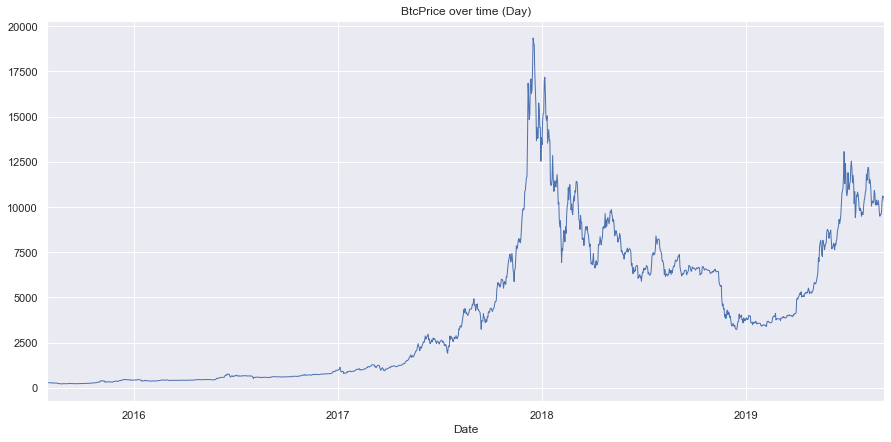

In [16]:
# Time Series Analysis
df_time = df_data.set_index('Date').copy()

df_time['Year'] = df_time.index.year
df_time['Month'] = df_time.index.month
df_time['Weekday Name'] = df_time.index.weekday_name


df_time.head()

sns.set_style("dark")
sns.set(rc={'figure.figsize':(15, 7)})

for element in columns[1:]:
    plt.show()
    df_time[element].plot(linewidth=1,title = element+" over time (Day)");

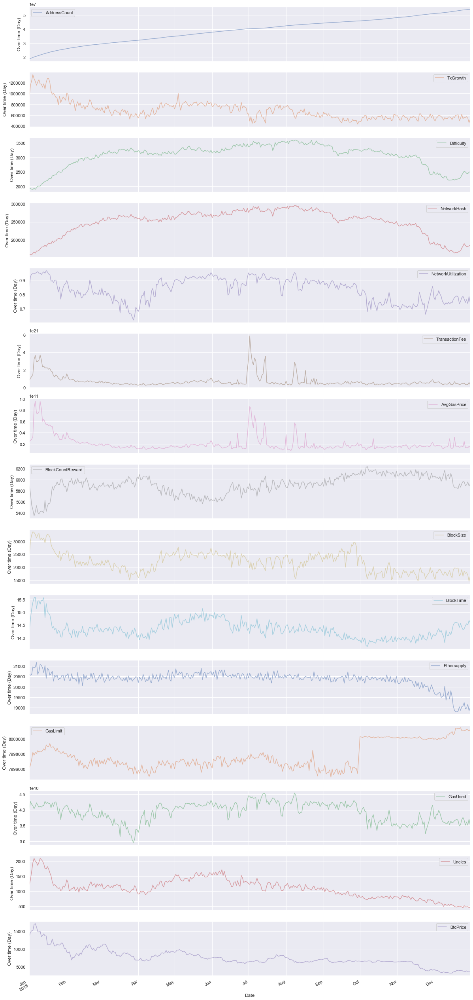

In [17]:
# columns
axes = df_time["2018"][columns[1:]].plot(alpha=0.5,  figsize=(20, 50), subplots=True)
for ax in axes:
    ax.set_ylabel('Over time (Day)')

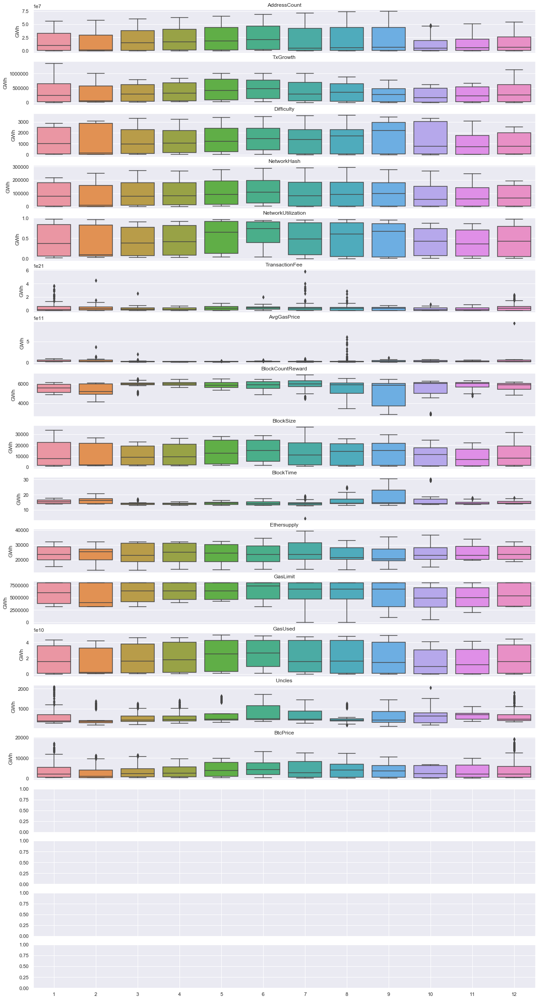

In [18]:
fig, axes = plt.subplots(19, 1, figsize=(20, 40), sharex=True)
for name, ax in zip(columns[1:], axes):
    sns.boxplot(data=df_time, x='Month', y=name, ax=ax)
    ax.set_ylabel('GWh')
    ax.set_title(name)
    # Remove the automatic x-axis label from all but the bottom subplot
    if ax != axes[-1]:
        ax.set_xlabel('')

### Seasonality Plot

Text(0.5, 1.0, 'BtcPrice')

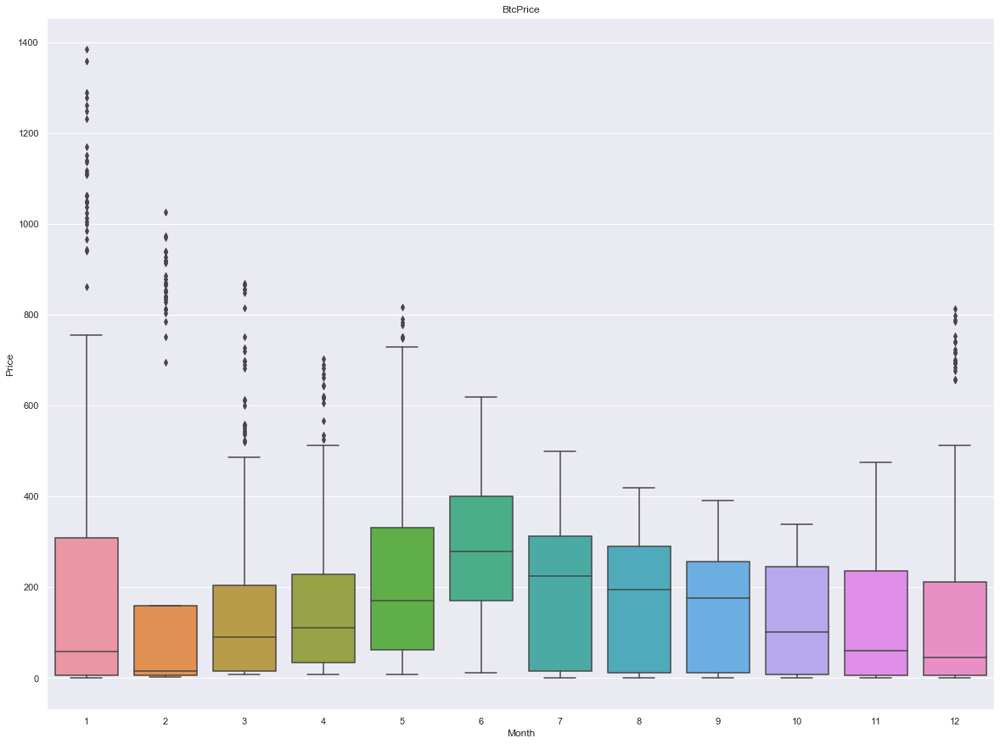

In [19]:
#monthly
fig, ax = plt.subplots(1, 1, figsize=(20, 15), sharex=True)
sns.boxplot(data=df_time, x='Month', y="Price", ax=ax)
ax.set_ylabel('Price')
ax.set_title(name)

Text(0.5, 1.0, 'BtcPrice')

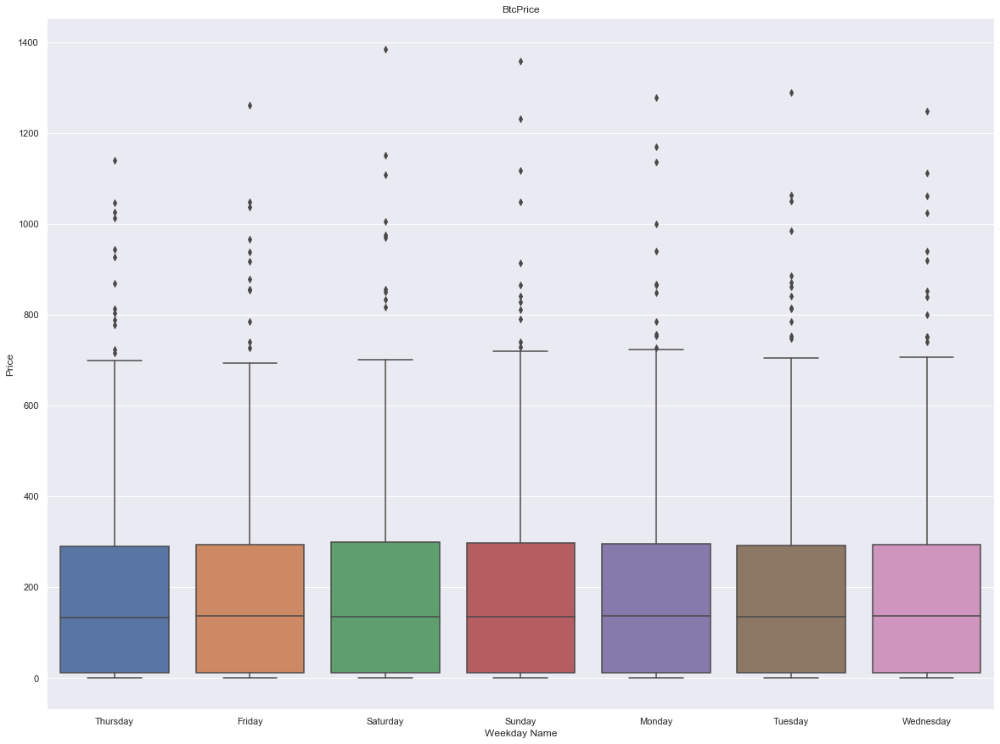

In [20]:
#Weekly
fig, ax = plt.subplots(1, 1, figsize=(20, 15), sharex=True)
sns.boxplot(data=df_time, x='Weekday Name', y="Price", ax=ax)
ax.set_ylabel('Price')
ax.set_title(name)

Text(0.5, 1.0, 'BtcPrice')

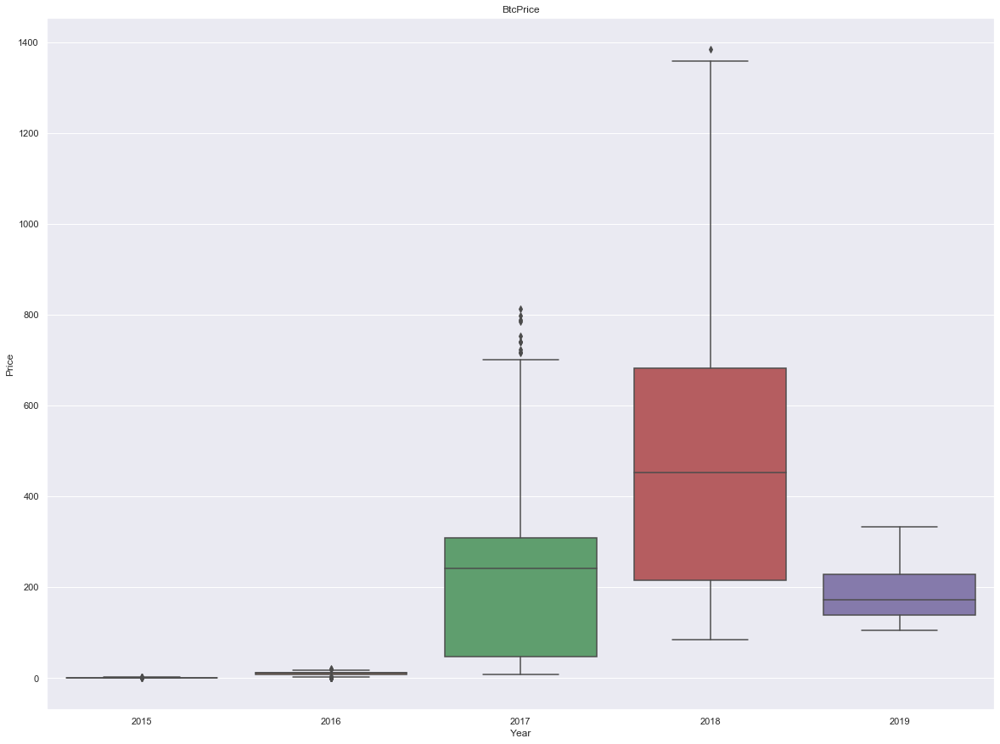

In [21]:
#monthly
fig, ax = plt.subplots(1, 1, figsize=(20, 15), sharex=True)
sns.boxplot(data=df_time, x='Year', y="Price", ax=ax)
ax.set_ylabel('Price')
ax.set_title(name)

In [22]:
df_time.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1500 entries, 2015-07-30 to 2019-09-06
Data columns (total 20 columns):
Supply                1500 non-null float64
AddressCount          1500 non-null float64
TxGrowth              1500 non-null float64
Difficulty            1500 non-null float64
NetworkHash           1500 non-null float64
NetworkUtilization    1500 non-null float64
TransactionFee        1500 non-null float64
AvgGasPrice           1500 non-null float64
BlockCountReward      1500 non-null float64
BlockSize             1500 non-null float64
BlockTime             1500 non-null float64
Ethersupply           1500 non-null float64
GasLimit              1500 non-null float64
GasUsed               1500 non-null float64
Uncles                1500 non-null float64
BtcPrice              1500 non-null float64
Price                 1500 non-null float64
Year                  1500 non-null int64
Month                 1500 non-null int64
Weekday Name          1500 non-null object


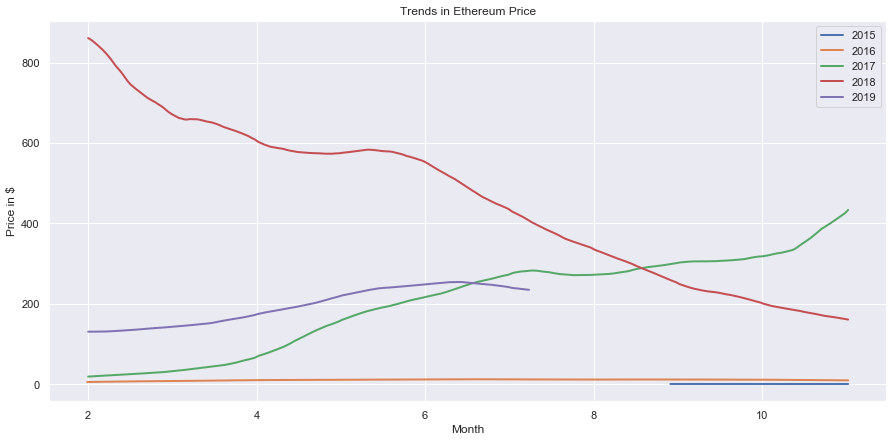

In [23]:

years = ['2015','2016','2017','2018','2019']
test = {}
for year in years:
    test[year] = df_time[year][["Month","Price"]].rolling(90, center=True).mean()
    
fig, ax = plt.subplots()
for a in test:
    ax.plot(test[a]["Month"],test[a]["Price"], linewidth=2, label= a)
ax.legend()
ax.set_xlabel('Month')
ax.set_ylabel('Price in $')
ax.set_title('Trends in Ethereum Price');

### Trend Plot

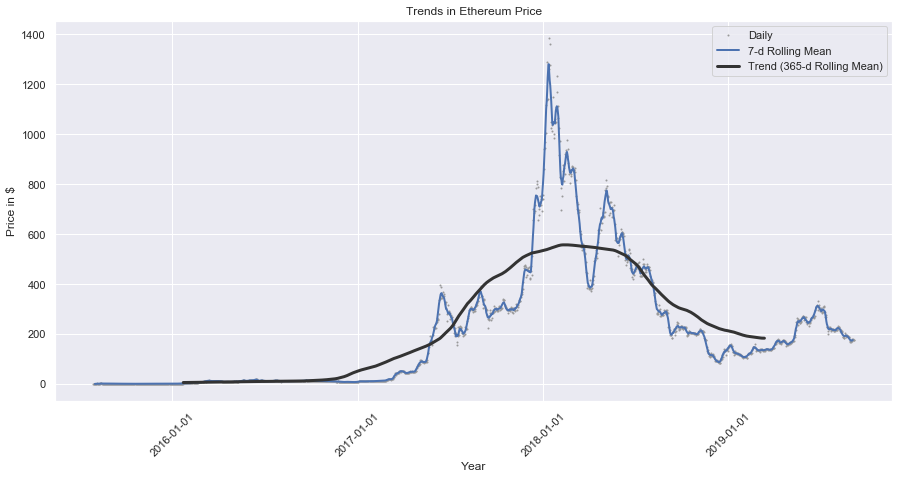

In [24]:
import matplotlib.dates as mdates

column='Price'
data_columns = ['Price','BtcPrice']
# The min_periods=360 argument accounts for a few isolated missing days in the
# wind and solar production time series
df_time_365d = df_time[data_columns].rolling(window=365, center=True, min_periods=360).mean()
df_time_7d = df_time[data_columns].rolling(7, center=True).mean()

# Plot daily, 7-day rolling mean, and 365-day rolling mean time series
fig, ax = plt.subplots()
ax.plot(df_time[column], marker='.', markersize=2, color='0.6',
linestyle='None', label='Daily')
ax.plot(df_time_7d[column], linewidth=2, label='7-d Rolling Mean')
ax.plot(df_time_365d[column], color='0.2', linewidth=3,
label='Trend (365-d Rolling Mean)')

# Set x-ticks to yearly interval and add legend and labels
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.legend()
ax.set_xlabel('Year')
ax.set_ylabel('Price in $')
ax.set_title('Trends in Ethereum Price');
for tick in ax.get_xticklabels():
    tick.set_rotation(45)

In [25]:
ax.get_xticklabels()

<a list of 5 Text xticklabel objects>

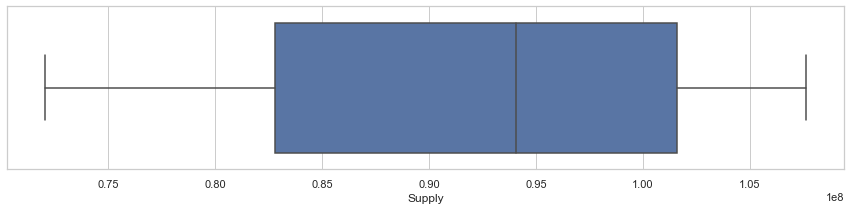

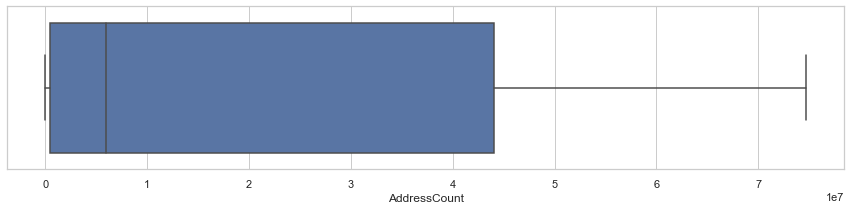

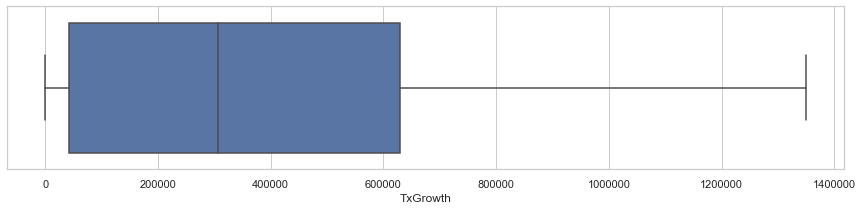

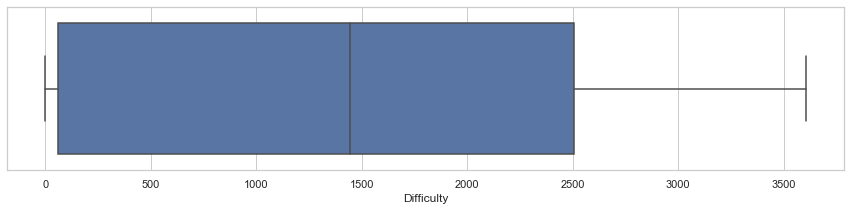

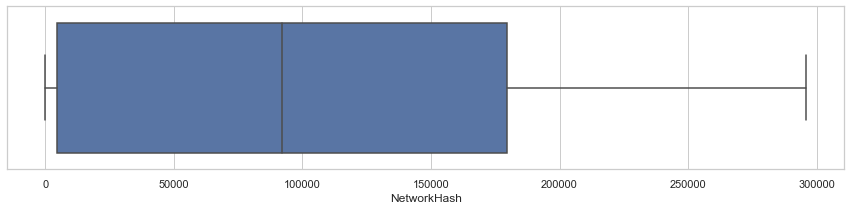

...

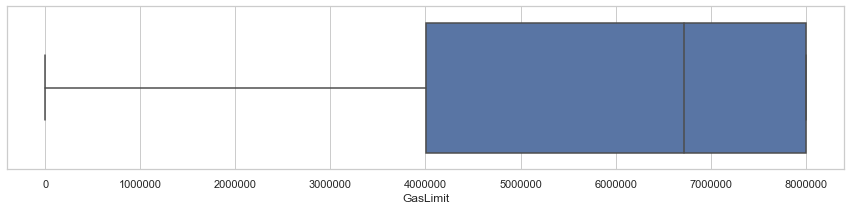

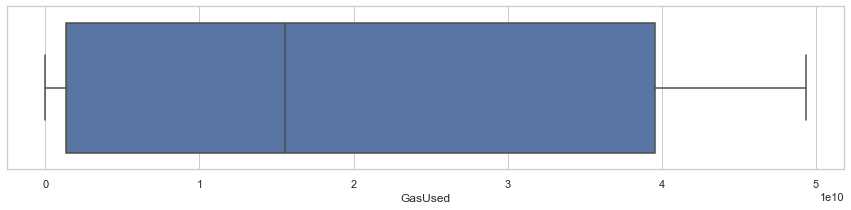

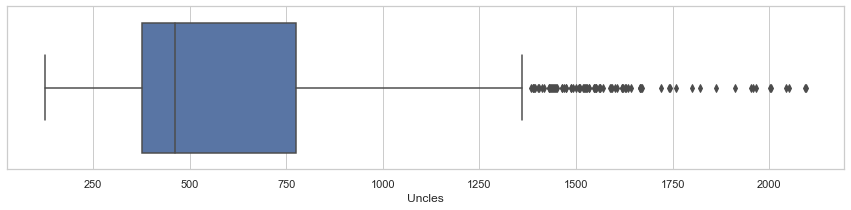

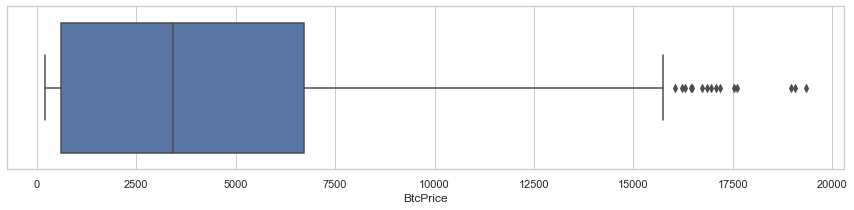

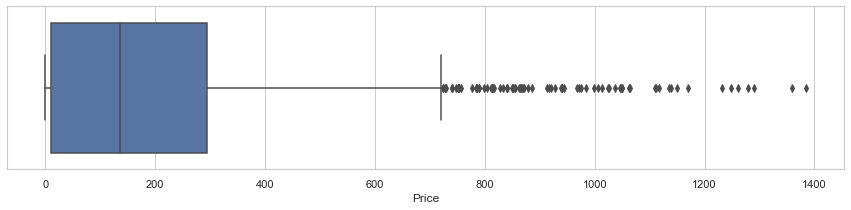

In [26]:
# Visualizations - BoxPlot
columns = df_data.columns
sns.set(style="whitegrid")

for element in columns[1:]:   
    plt.figure(figsize = (15,3))
    ax = sns.boxplot(x=df_data[element])

## 3) Feature Engineering

In [27]:
df_time.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1500 entries, 2015-07-30 to 2019-09-06
Data columns (total 20 columns):
Supply                1500 non-null float64
AddressCount          1500 non-null float64
TxGrowth              1500 non-null float64
Difficulty            1500 non-null float64
NetworkHash           1500 non-null float64
NetworkUtilization    1500 non-null float64
TransactionFee        1500 non-null float64
AvgGasPrice           1500 non-null float64
BlockCountReward      1500 non-null float64
BlockSize             1500 non-null float64
BlockTime             1500 non-null float64
Ethersupply           1500 non-null float64
GasLimit              1500 non-null float64
GasUsed               1500 non-null float64
Uncles                1500 non-null float64
BtcPrice              1500 non-null float64
Price                 1500 non-null float64
Year                  1500 non-null int64
Month                 1500 non-null int64
Weekday Name          1500 non-null object


In [28]:
#set Y variable
etherPrice = df_data[['Date','Price']].set_index('Date')


### Normalization

In [29]:
from sklearn import preprocessing

def normalise_var(x):
    min_max_scaler = preprocessing.MinMaxScaler()
    x_scaled = min_max_scaler.fit_transform(x)
    normalised_features = pd.DataFrame(columns=x.columns.values, data=x_scaled)
    return normalised_features


### Feature for TS model

In [30]:

x_var = df_data.iloc[:,1:-1] 
normalised_TS_features = normalise_var(x_var)
#make into timeseries
normalised_TS_features["Date"] = df_data["Date"]
normalised_TS_features = normalised_TS_features.set_index('Date')


### Feature with suprevised learning

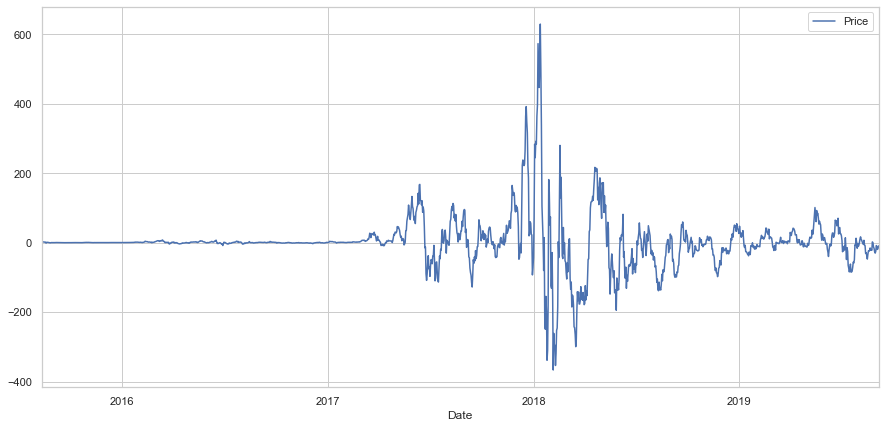

In [31]:
#Make Stationary
differenced = etherPrice.diff(12)
differenced = differenced[12:]
# Seasonality Adjusted
differenced.plot()
plt.show()

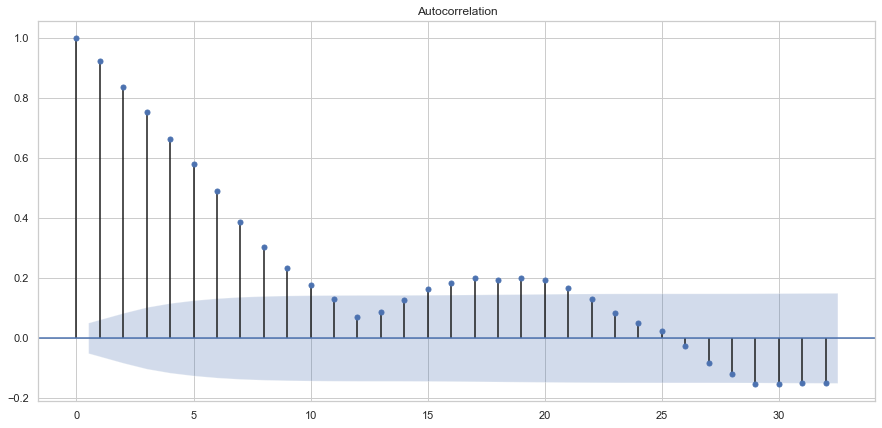

In [32]:
# Autocorrelation Plot
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(differenced)
plt.show()

In [33]:
# reframe as supervised learning
lag_var = pd.DataFrame()
for i in range(12,0,-1):
    lag_var['t-'+str(i)] = differenced["Price"].shift(i).values
lag_var['t'] = differenced["Price"].values
display(lag_var.head(13))
lag_var = lag_var[13:]

,t-12,t-11,t-10,t-9,t-8,t-7,t-6,t-5,t-4,t-3,t-2,t-1,t
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.06
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.06,1.25
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.06,1.25,1.78
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.06,1.25,1.78,1.80
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.06,1.25,1.78,1.80,1.79
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.06,1.25,1.78,1.80,1.79,1.37
6,NaN,NaN,NaN,NaN,NaN,NaN,1.06,1.25,1.78,1.80,1.79,1.37,1.20
7,NaN,NaN,NaN,NaN,NaN,1.06,1.25,1.78,1.80,1.79,1.37,1.20,1.27
8,NaN,NaN,NaN,NaN,1.06,1.25,1.78,1.80,1.79,1.37,1.20,1.27,-1.51
9,NaN,NaN,NaN,1.06,1.25,1.78,1.80,1.79,1.37,1.20,1.27,-1.51,0.67


In [34]:
normalise_Lag_features = normalise_var(lag_var)

In [35]:
normalise_Lag_features.head()

,t-12,t-11,t-10,t-9,t-8,t-7,t-6,t-5,t-4,t-3,t-2,t-1,t
0,0.369606,0.370138,0.370158,0.370148,0.369726,0.369556,0.369626,0.366833,0.369023,0.369053,0.369063,0.368642,0.368340
1,0.370138,0.370158,0.370148,0.369726,0.369556,0.369626,0.366833,0.369023,0.369053,0.369063,0.368642,0.368340,0.367737
2,0.370158,0.370148,0.369726,0.369556,0.369626,0.366833,0.369023,0.369053,0.369063,0.368642,0.368340,0.367737,0.367707
3,0.370148,0.369726,0.369556,0.369626,0.366833,0.369023,0.369053,0.369063,0.368642,0.368340,0.367737,0.367707,0.367687
4,0.369726,0.369556,0.369626,0.366833,0.369023,0.369053,0.369063,0.368642,0.368340,0.367737,0.367707,0.367687,0.368280


### Feature Importance plots and selection

1) Random Forest Regression. We can use feature importance to help to estimate the relative importance of contrived input features for time series forecasting.
2) A popular method for feature selection is called Recursive Feature Selection (RFE). RFE works by creating predictive models, weighting features, and pruning those with the smallest weights, then repeating the process until a desired number of features are left. Smaller is better

In [36]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFE

def plot_featimp(X,y):
    # fit random forest model
    model = RandomForestRegressor(n_estimators=500, random_state=1)
    model.fit(X, y)
    # show importance scores
    print(model.feature_importances_)
    # plot importance scores
    names = X.columns.values
    ticks = [i for i in range(len(names))]
    plt.bar(ticks, model.feature_importances_)
    plt.xticks(ticks, names, rotation='vertical')
    plt.title("Feature Importance")
    plt.show()
    

def select_feature(X,y):
    rfe = RFE(RandomForestRegressor(n_estimators=500, random_state=1), 4)
    fit = rfe.fit(X, y)
    # report selected features
    print('Selected Features:')
    names = X.columns.values
    for i in range(len(fit.support_)):
        if fit.support_[i]:
            print(names[i])
    ticks = [i for i in range(len(names))]
    plt.bar(ticks, fit.ranking_)
    plt.xticks(ticks, names, rotation="vertical")
    plt.show()

[0.04764777 0.04812178 0.01529653 0.02647671 0.02928354 0.00541375
 0.00272383 0.00099691 0.00166554 0.00389165 0.00070278 0.00592179
 0.05668781 0.0105905  0.58459207 0.15998706]


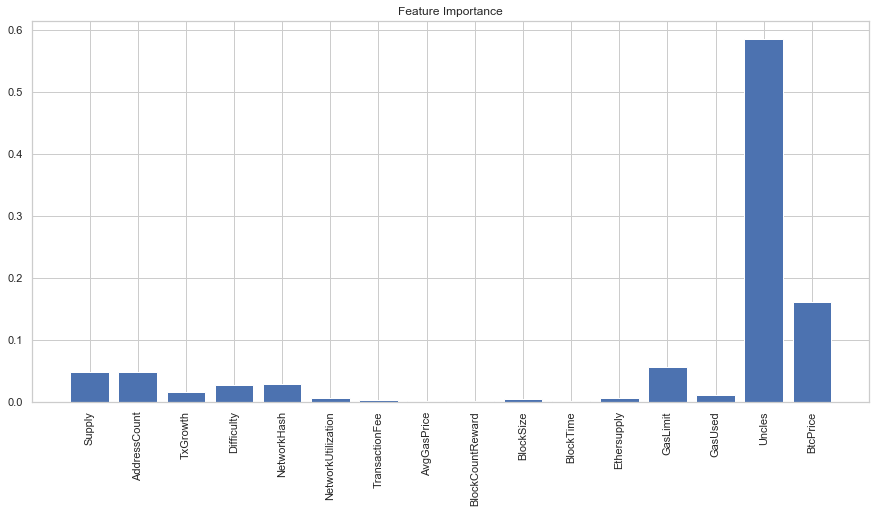

Selected Features:
Supply
AddressCount
Uncles
BtcPrice


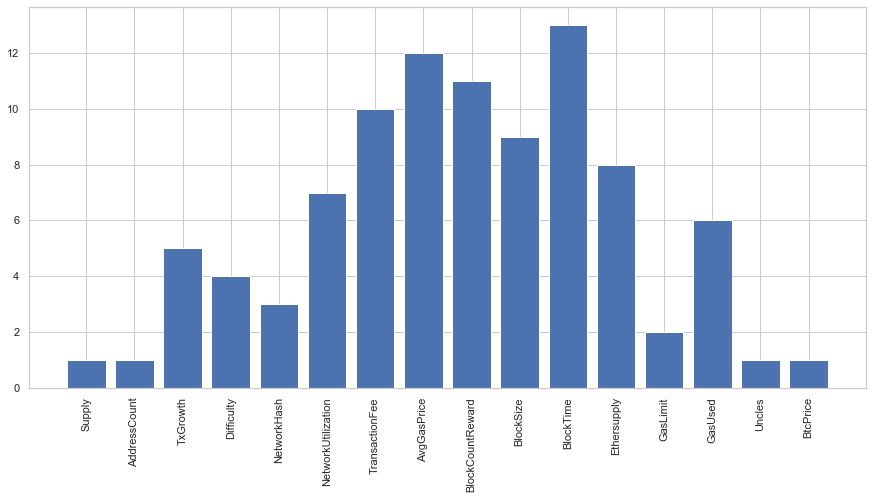

In [37]:
# with ts model
plot_featimp(normalised_TS_features,etherPrice)
select_feature(normalised_TS_features,etherPrice)

[0.01030228 0.01136461 0.00935514 0.00904723 0.0092302  0.01067421
 0.01025248 0.00759406 0.01003438 0.01490129 0.03940738 0.85783675]


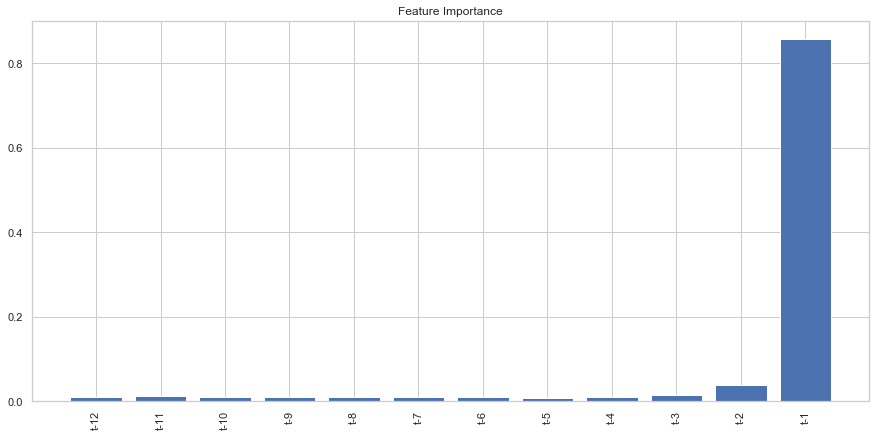

Selected Features:
t-11
t-7
t-2
t-1


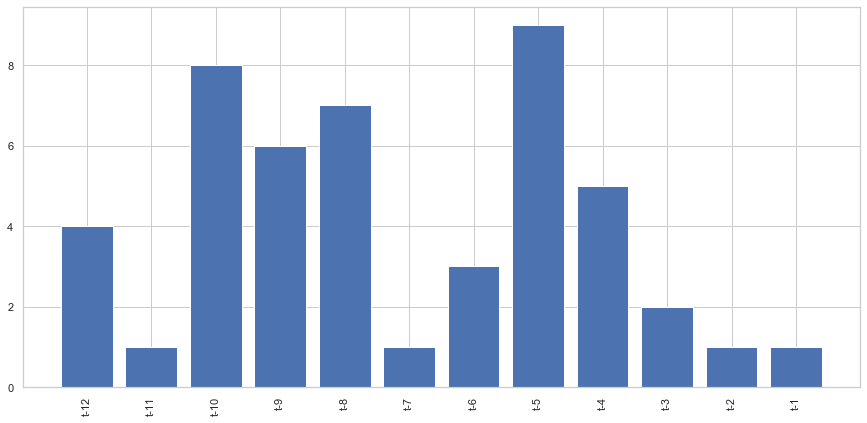

In [38]:
from sklearn.ensemble import RandomForestRegressor

X = normalise_Lag_features.iloc[:,0:-1]
y = normalise_Lag_features.iloc[:,-1]

# with supervised learning
plot_featimp(X,y)
select_feature(X,y)

# DATA STATIONARITY FROM TAMRA VIDEO

In [39]:
from statsmodels.tsa.stattools import adfuller
def test_stationarity(df, ts):
    # Determing rolling statistics
    rolmean = df[ts].rolling(window = 12, center = False).mean()
    rolstd = df[ts].rolling(window = 12, center = False).std()
    
    # Plot rolling statistics:
    orig = plt.plot(df[ts], 
                    color = 'blue', 
                    label = 'Original')
    mean = plt.plot(rolmean, 
                    color = 'red', 
                    label = 'Rolling Mean')
    std = plt.plot(rolstd, 
                   color = 'black', 
                   label = 'Rolling Std')
    plt.legend(loc = 'best')
    plt.title('Rolling Mean & Standard Deviation for %s' %(ts))
    plt.xticks(rotation = 45)
    plt.show(block = False)
    plt.close()
    
    # Perform Dickey-Fuller test:
    # Null Hypothesis (H_0): time series is not stationary
    # Alternate Hypothesis (H_1): time series is stationary
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(df[ts], 
                      autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], 
                         index = ['Test Statistic',
                                  'p-value',
                                  '# Lags Used',
                                  'Number of Observations Used'])
    for key, value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)
    return dfoutput['p-value']

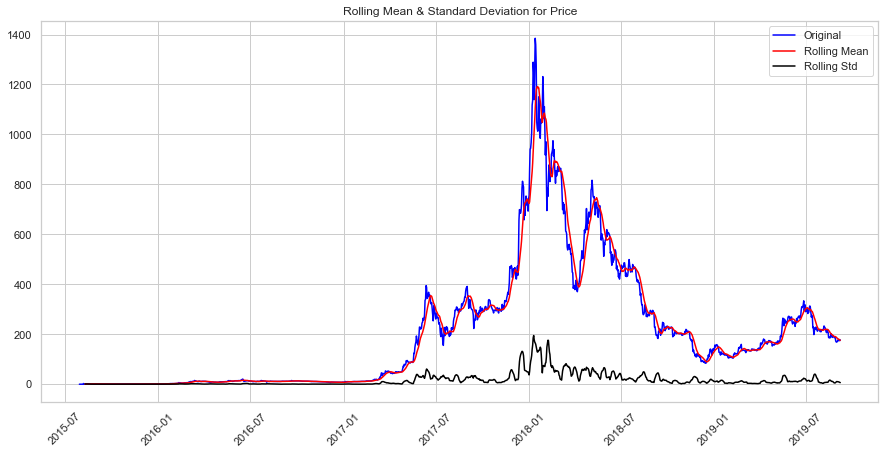

Results of Dickey-Fuller Test:
Test Statistic                   -2.074704
p-value                           0.254807
# Lags Used                      23.000000
Number of Observations Used    1476.000000
Critical Value (1%)              -3.434788
Critical Value (5%)              -2.863500
Critical Value (10%)             -2.567814
dtype: float64


0.25480727262756

In [40]:
test_stationarity(etherPrice,"Price")

To make it stationary, the P-value needs to be <= 0.05, but since it's 0.25 so our data is not stationary and we need to try some transformation to make it stationary

In [41]:
def plot_transformed_data(df, ts, ts_transform):
  # Plot time series data
    fig, ax = plt.subplots(1,1)
    ax.plot(df[ts])
    ax.plot(df[ts_transform], color = 'red')

    # Add title
    ax.set_title('%s and %s time-series graph' %(ts, ts_transform))

    # Rotate x-labels
    ax.tick_params(axis = 'x', rotation = 45)

    # Add legend
    ax.legend([ts, ts_transform])

    plt.show()

,Price,ts_log,ts_log_moving_avg,ts_moving_avg,ts_log_diff,ts_moving_avg_diff,ts_log_moving_avg_diff,ts_log_ewma,ts_log_ewma_diff
Date,,,,,,,,,
2015-08-13,1.78,0.576613,0.139912,1.298571,0.353470,0.481429,0.436701,0.576613,0.000000
2015-08-14,1.80,0.587787,0.078332,1.160000,0.011173,0.640000,0.509455,0.582476,0.005310
2015-08-15,1.79,0.582216,0.191609,1.300000,-0.005571,0.490000,0.390607,0.582381,-0.000165
2015-08-16,1.37,0.314811,0.279597,1.390000,-0.267405,-0.020000,0.035214,0.505250,-0.190440
2015-08-17,1.20,0.182322,0.360737,1.464286,-0.132489,-0.264286,-0.178416,0.427286,-0.244964


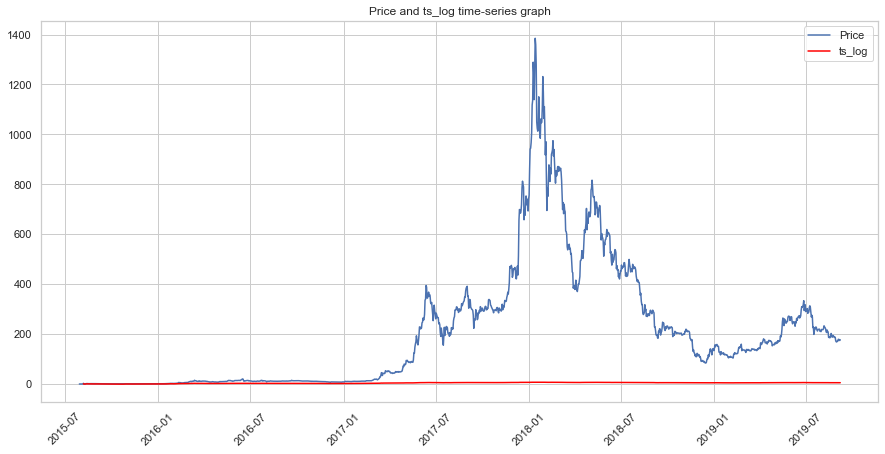

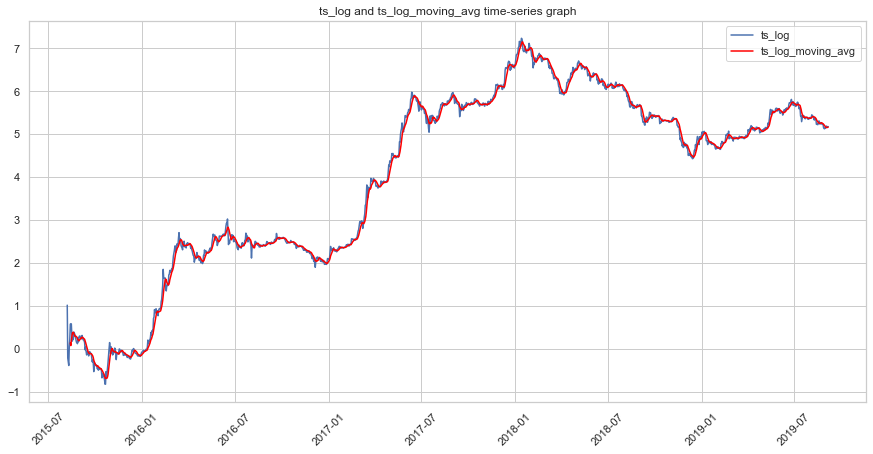

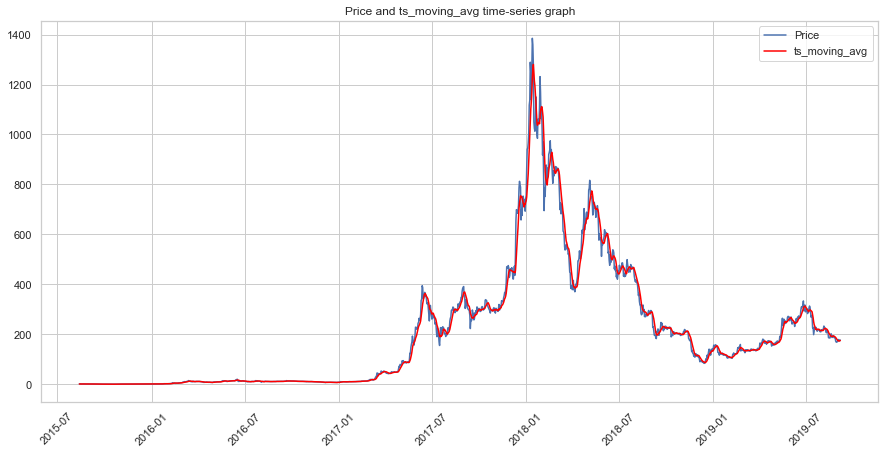

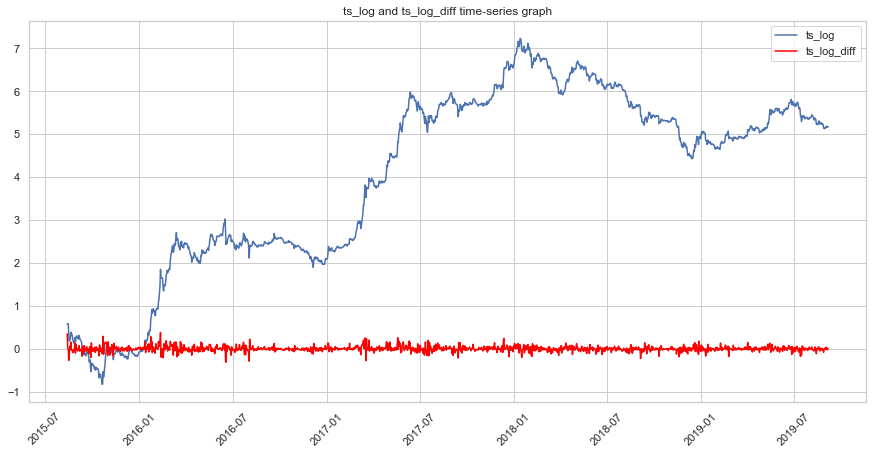

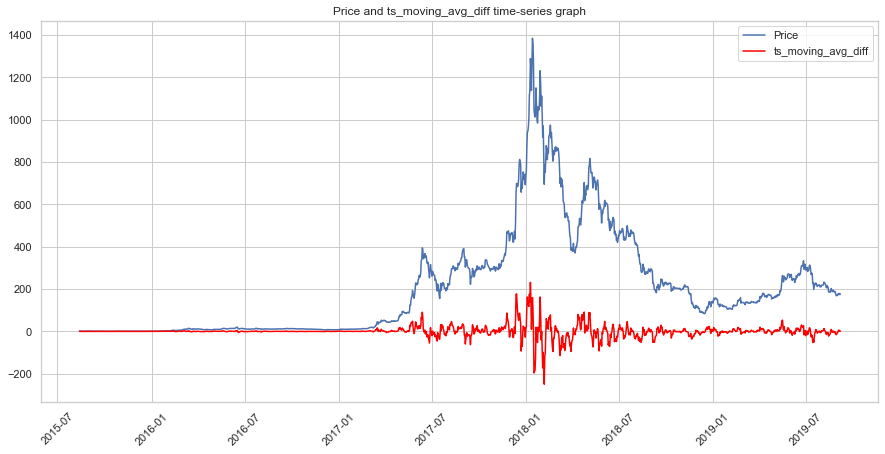

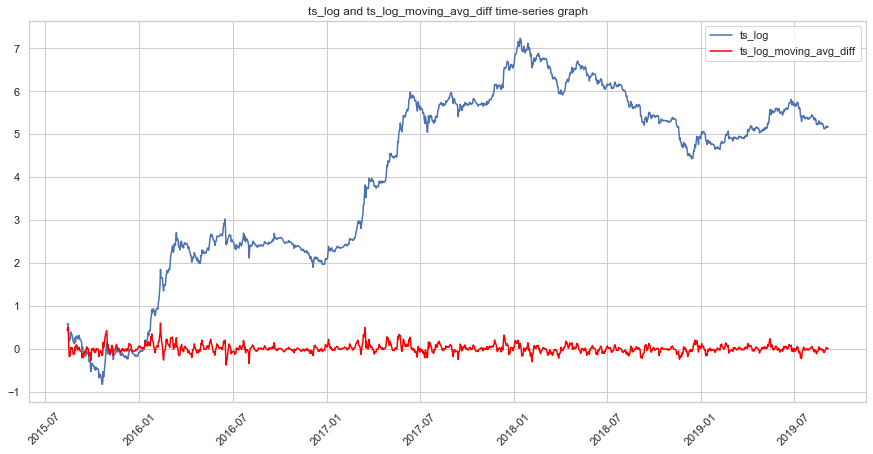

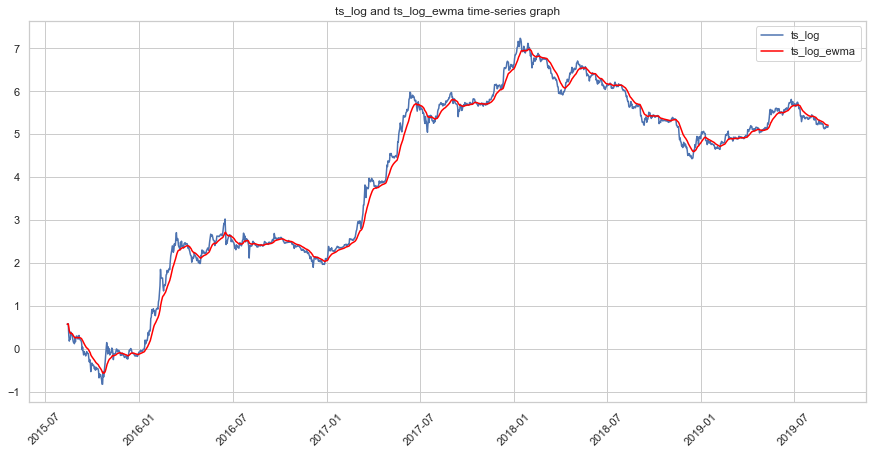

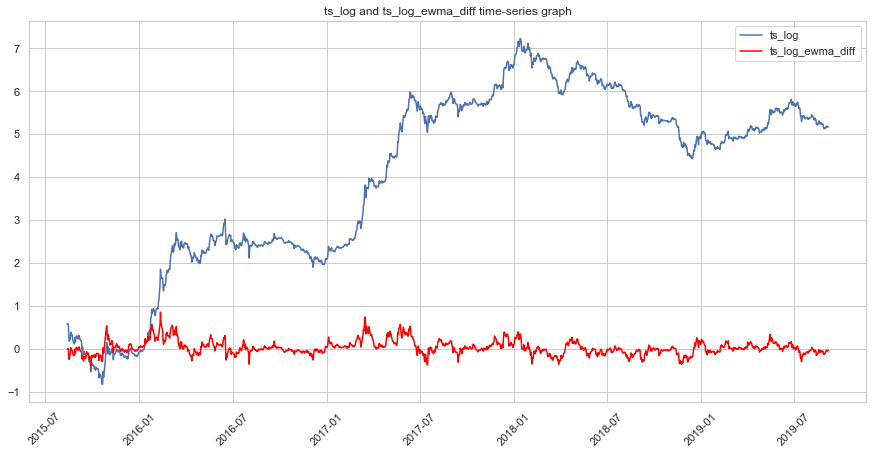

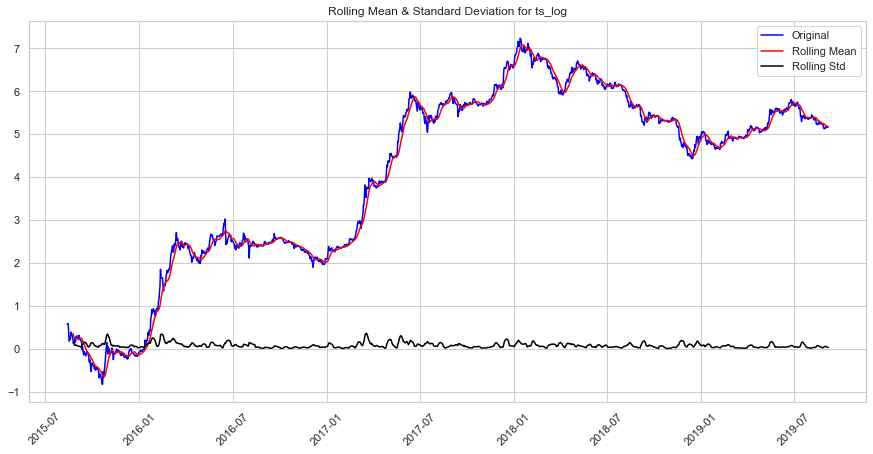

Results of Dickey-Fuller Test:
Test Statistic                   -1.751921
p-value                           0.404579
# Lags Used                       3.000000
Number of Observations Used    1482.000000
Critical Value (1%)              -3.434770
Critical Value (5%)              -2.863492
Critical Value (10%)             -2.567809
dtype: float64


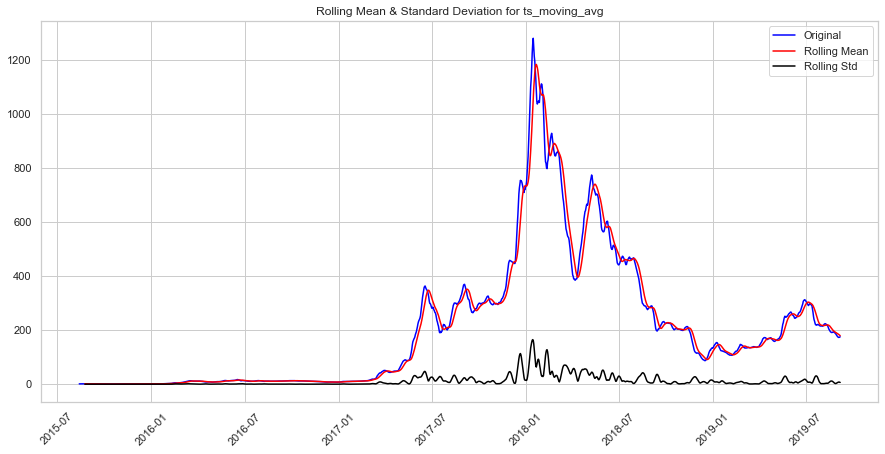

Results of Dickey-Fuller Test:
Test Statistic                   -2.137664
p-value                           0.229642
# Lags Used                      24.000000
Number of Observations Used    1461.000000
Critical Value (1%)              -3.434834
Critical Value (5%)              -2.863520
Critical Value (10%)             -2.567824
dtype: float64


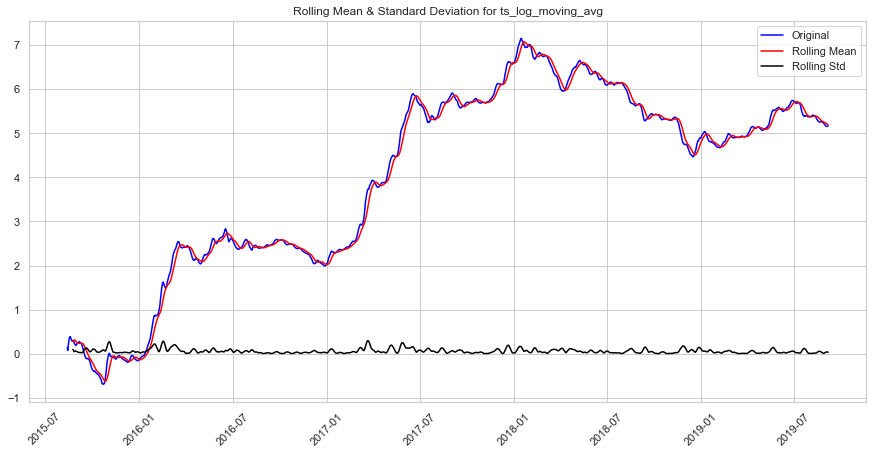

Results of Dickey-Fuller Test:
Test Statistic                   -1.739968
p-value                           0.410646
# Lags Used                      23.000000
Number of Observations Used    1462.000000
Critical Value (1%)              -3.434831
Critical Value (5%)              -2.863519
Critical Value (10%)             -2.567824
dtype: float64


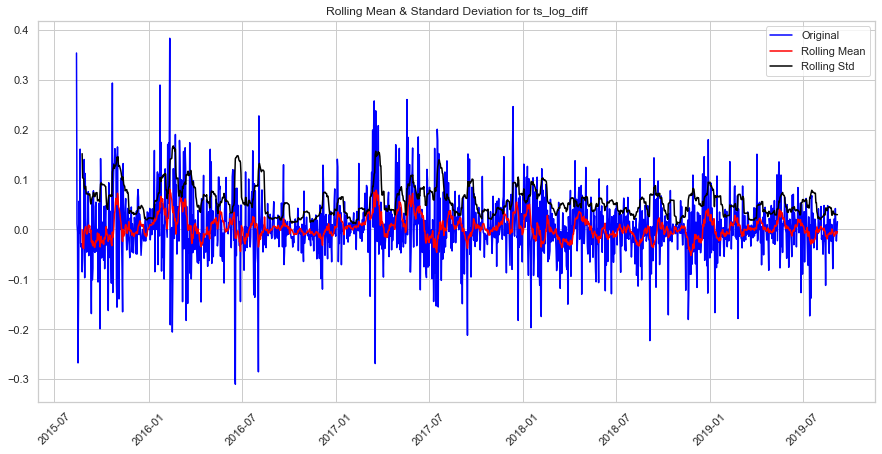

Results of Dickey-Fuller Test:
Test Statistic                  -20.742465
p-value                           0.000000
# Lags Used                       2.000000
Number of Observations Used    1483.000000
Critical Value (1%)              -3.434767
Critical Value (5%)              -2.863491
Critical Value (10%)             -2.567809
dtype: float64


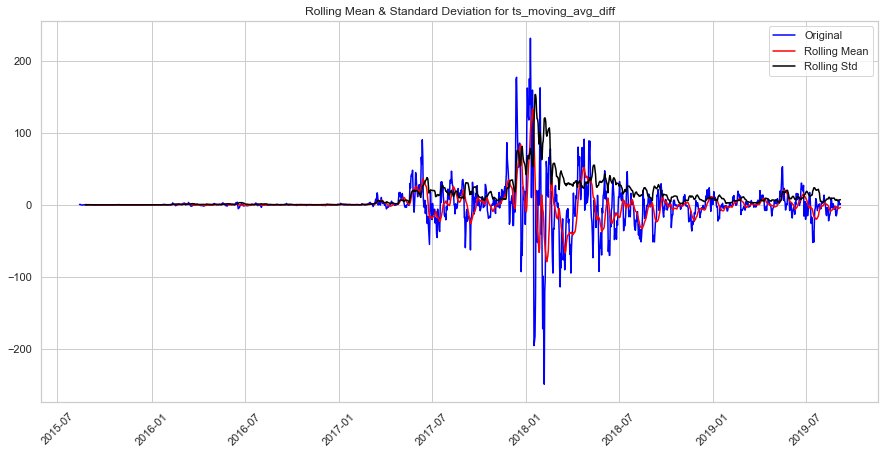

Results of Dickey-Fuller Test:
Test Statistic                -7.163487e+00
p-value                        2.926811e-10
# Lags Used                    2.000000e+01
Number of Observations Used    1.465000e+03
Critical Value (1%)           -3.434822e+00
Critical Value (5%)           -2.863515e+00
Critical Value (10%)          -2.567821e+00
dtype: float64


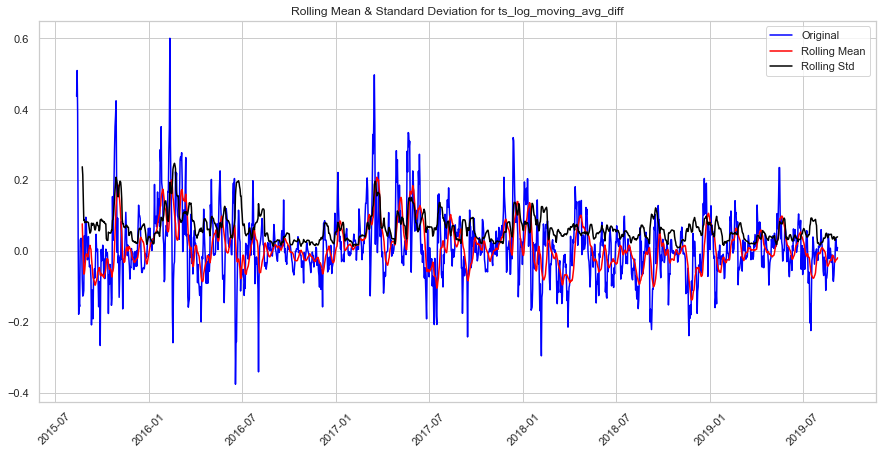

Results of Dickey-Fuller Test:
Test Statistic                -6.837409e+00
p-value                        1.827535e-09
# Lags Used                    1.400000e+01
Number of Observations Used    1.471000e+03
Critical Value (1%)           -3.434803e+00
Critical Value (5%)           -2.863507e+00
Critical Value (10%)          -2.567817e+00
dtype: float64


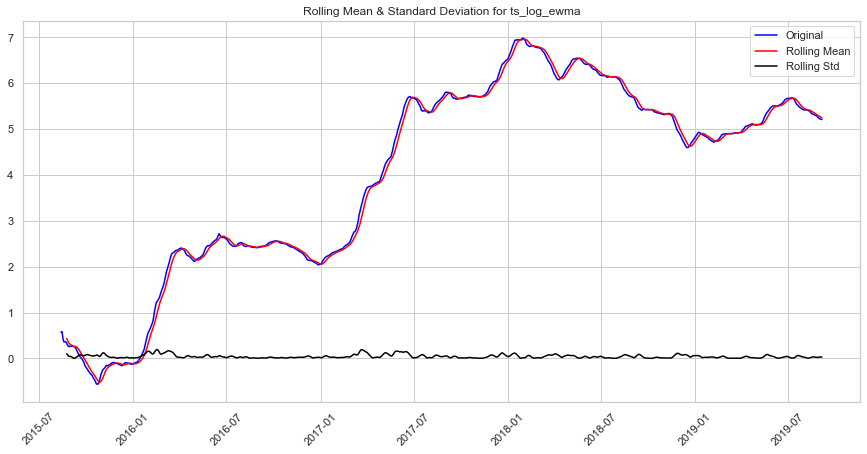

Results of Dickey-Fuller Test:
Test Statistic                   -1.546149
p-value                           0.510571
# Lags Used                       2.000000
Number of Observations Used    1483.000000
Critical Value (1%)              -3.434767
Critical Value (5%)              -2.863491
Critical Value (10%)             -2.567809
dtype: float64


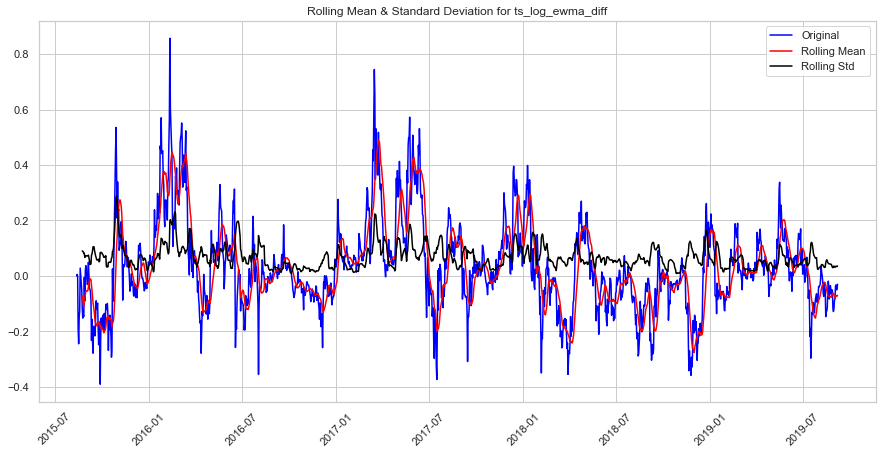

Results of Dickey-Fuller Test:
Test Statistic                -6.791175e+00
p-value                        2.362577e-09
# Lags Used                    1.000000e+00
Number of Observations Used    1.484000e+03
Critical Value (1%)           -3.434764e+00
Critical Value (5%)           -2.863490e+00
Critical Value (10%)          -2.567808e+00
dtype: float64


In [42]:
# Transformation - log ts
etherPrice['ts_log'] = etherPrice['Price'].apply(lambda x: np.log(x))

# Transformation - 7-day moving averages of log ts
etherPrice['ts_log_moving_avg'] = etherPrice['ts_log'].rolling(window = 7,
                                                               center = False).mean()

# Transformation - 7-day moving average ts
etherPrice['ts_moving_avg'] =  etherPrice['Price'].rolling(window = 7,
                                                       center = False).mean()

# Transformation - Difference between logged ts and first-order difference logged ts
# df_example['ts_log_diff'] = df_example['ts_log'] - df_example['ts_log'].shift()
etherPrice['ts_log_diff'] = etherPrice['ts_log'].diff()

# Transformation - Difference between ts and moving average ts
etherPrice['ts_moving_avg_diff'] = etherPrice['Price'] - etherPrice['ts_moving_avg']

# Transformation - Difference between logged ts and logged moving average ts
etherPrice['ts_log_moving_avg_diff'] = etherPrice['ts_log'] - etherPrice['ts_log_moving_avg']

# Transformation - Difference between logged ts and logged moving average ts
df_example_transform = etherPrice.dropna()

# Transformation - Logged exponentially weighted moving averages (EWMA) ts
df_example_transform['ts_log_ewma'] = df_example_transform['ts_log'].ewm(halflife = 7,
                                                                         ignore_na = False,
                                                                         min_periods = 0,
                                                                         adjust = True).mean()

# Transformation - Difference between logged ts and logged EWMA ts
df_example_transform['ts_log_ewma_diff'] = df_example_transform['ts_log'] - df_example_transform['ts_log_ewma']

# Display data
display(df_example_transform.head())

# Plot data
plot_transformed_data(df = etherPrice, 
                      ts = 'Price', 
                      ts_transform = 'ts_log')
# Plot data
plot_transformed_data(df = etherPrice, 
                      ts = 'ts_log', 
                      ts_transform = 'ts_log_moving_avg')

# Plot data
plot_transformed_data(df = df_example_transform, 
                      ts = 'Price', 
                      ts_transform = 'ts_moving_avg')

# Plot data
plot_transformed_data(df = df_example_transform, 
                      ts = 'ts_log', 
                      ts_transform = 'ts_log_diff')

# Plot data
plot_transformed_data(df = df_example_transform, 
                      ts = 'Price', 
                      ts_transform = 'ts_moving_avg_diff')

# Plot data
plot_transformed_data(df = df_example_transform, 
                      ts = 'ts_log', 
                      ts_transform = 'ts_log_moving_avg_diff')

# Plot data
plot_transformed_data(df = df_example_transform, 
                      ts = 'ts_log', 
                      ts_transform = 'ts_log_ewma')

# Plot data
plot_transformed_data(df = df_example_transform, 
                      ts = 'ts_log', 
                      ts_transform = 'ts_log_ewma_diff')

p_values = {}
# Perform stationarity test
p_values["ts_log"] = test_stationarity(df = df_example_transform, ts = 'ts_log')

# Perform stationarity test
p_values["ts_moving_avg"] = test_stationarity(df = df_example_transform, 
                  ts = 'ts_moving_avg')

# Perform stationarity test
p_values["ts_log_moving_avg"] = test_stationarity(df = df_example_transform, 
                  ts = 'ts_log_moving_avg')

# Perform stationarity test
p_values["ts_log_diff"] = test_stationarity(df = df_example_transform,
                  ts = 'ts_log_diff')

# Perform stationarity test
p_values["ts_moving_avg_diff"] = test_stationarity(df = df_example_transform,
                  ts = 'ts_moving_avg_diff')

# Perform stationarity test
p_values["ts_log_moving_avg_diff"] = test_stationarity(df = df_example_transform,
                  ts = 'ts_log_moving_avg_diff')

# Perform stationarity test
p_values["ts_log_ewma"] = test_stationarity(df = df_example_transform, 
                  ts = 'ts_log_ewma')

# Perform stationarity test
p_values["ts_log_ewma_diff"] = test_stationarity(df = df_example_transform,
                  ts = 'ts_log_ewma_diff')


In [43]:
print(p_values)

{'ts_log': 0.40457917334827515, 'ts_moving_avg': 0.22964160811680623, 'ts_log_moving_avg': 0.41064608814156106, 'ts_log_diff': 0.0, 'ts_moving_avg_diff': 2.926811254341193e-10, 'ts_log_moving_avg_diff': 1.827534605751603e-09, 'ts_log_ewma': 0.510571139340731, 'ts_log_ewma_diff': 2.362576829101344e-09}


# For Hanan <3

The best stationary data from transformation is df_example_transform['ts_moving_avg_diff'] with 2.926811254341193e-10 as it's the smallest one (at least that what I understood from the video), Now you can use this data to put at the arima model instead of the usual price

In [44]:
def plot_decomposition(df, ts, trend, seasonal, residual):
    """
    Plot time series data
    """
    f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2, figsize = (15, 5), sharex = True)

    ax1.plot(df[ts], label = 'Original')
    ax1.legend(loc = 'best')
    ax1.tick_params(axis = 'x', rotation = 45)

    ax2.plot(df[trend], label = 'Trend')
    ax2.legend(loc = 'best')
    ax2.tick_params(axis = 'x', rotation = 45)

    ax3.plot(df[seasonal],label = 'Seasonality')
    ax3.legend(loc = 'best')
    ax3.tick_params(axis = 'x', rotation = 45)

    ax4.plot(df[residual], label = 'Residuals')
    ax4.legend(loc = 'best')
    ax4.tick_params(axis = 'x', rotation = 45)
    plt.tight_layout()

    # Show graph
    plt.suptitle('Trend, Seasonal, and Residual Decomposition of %s' %(ts), 
               x = 0.5, 
               y = 1.05, 
               fontsize = 18)
    plt.show()

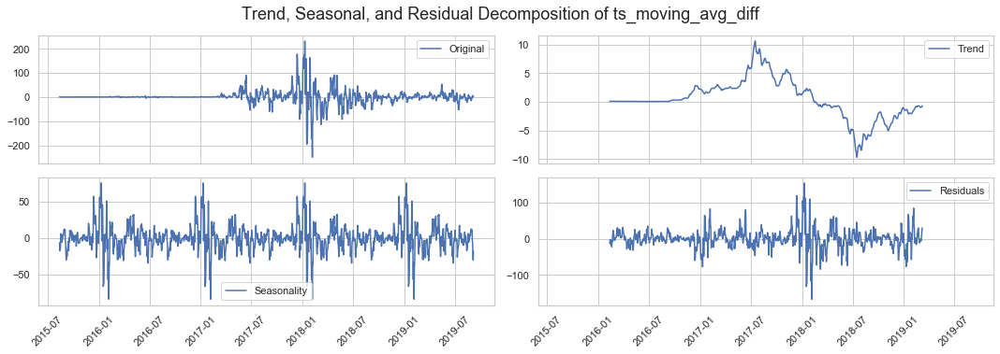

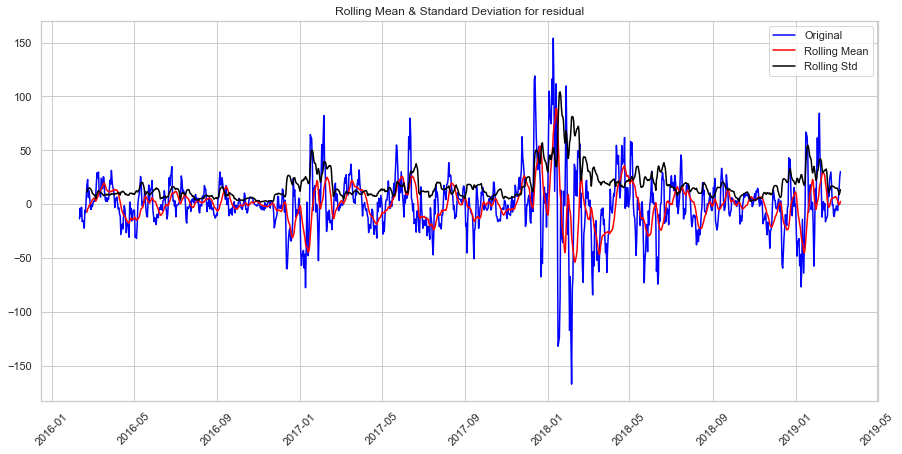

Results of Dickey-Fuller Test:
Test Statistic                -6.384511e+00
p-value                        2.180938e-08
# Lags Used                    2.000000e+01
Number of Observations Used    1.101000e+03
Critical Value (1%)           -3.436303e+00
Critical Value (5%)           -2.864169e+00
Critical Value (10%)          -2.568170e+00
dtype: float64


2.180938411261469e-08

In [45]:
from statsmodels.tsa.seasonal import seasonal_decompose
decomposition = seasonal_decompose(df_example_transform['ts_moving_avg_diff'], freq = 365)

df_example_transform.loc[:,'trend'] = decomposition.trend
df_example_transform.loc[:,'seasonal'] = decomposition.seasonal
df_example_transform.loc[:,'residual'] = decomposition.resid

plot_decomposition(df = df_example_transform, 
                   ts = 'ts_moving_avg_diff', 
                   trend = 'trend',
                   seasonal = 'seasonal', 
                   residual = 'residual')

test_stationarity(df = df_example_transform.dropna(), ts = 'residual')

In [46]:
def plot_acf_pacf(df, ts):
    f, (ax1, ax2) = plt.subplots(1,2, figsize = (10, 5)) 

    #Plot ACF: 

    ax1.plot(lag_acf)
    ax1.axhline(y=0,linestyle='--',color='gray')
    ax1.axhline(y=-1.96/np.sqrt(len(df[ts])),linestyle='--',color='gray')
    ax1.axhline(y=1.96/np.sqrt(len(df[ts])),linestyle='--',color='gray')
    ax1.set_title('Autocorrelation Function for %s' %(ts))

    #Plot PACF:
    ax2.plot(lag_pacf)
    ax2.axhline(y=0,linestyle='--',color='gray')
    ax2.axhline(y=-1.96/np.sqrt(len(df[ts])),linestyle='--',color='gray')
    ax2.axhline(y=1.96/np.sqrt(len(df[ts])),linestyle='--',color='gray')
    ax2.set_title('Partial Autocorrelation Function for %s' %(ts))

    plt.tight_layout()
    plt.show()

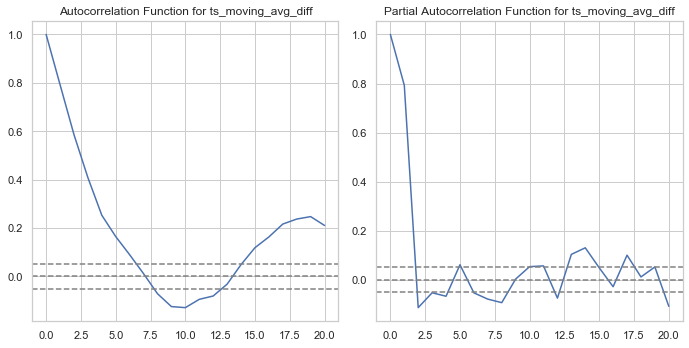

In [47]:
from statsmodels.tsa.stattools import acf, pacf

# determine ACF and PACF
lag_acf = acf(np.array(df_example_transform['ts_moving_avg_diff']), nlags = 20)
lag_pacf = pacf(np.array(df_example_transform['ts_moving_avg_diff']), nlags = 20)

# plot ACF and PACF
plot_acf_pacf(df = df_example_transform, ts = 'ts_moving_avg_diff')

# For Hanan again :)

I tried to test these transformations data using basic ARIMA model, and maybe you can try it with the model that you've make using this example

In [48]:
#change this using your model
def run_arima_model(df, ts, p, d, q):
    from statsmodels.tsa.arima_model import ARIMA

    # fit ARIMA model on time series
    model = ARIMA(df[ts], order=(p, d, q))  
    results_ = model.fit(disp=-1)  

    # get lengths correct to calculate RSS
    len_results = len(results_.fittedvalues)
    ts_modified = df[ts][-len_results:]

    # calculate root mean square error (RMSE) and residual sum of squares (RSS)
    rss = sum((results_.fittedvalues - ts_modified)**2)
    rmse = np.sqrt(rss / len(df[ts]))

    # plot fit
    plt.plot(df[ts])
    plt.plot(results_.fittedvalues, color = 'red')
    plt.title('For ARIMA model (%i, %i, %i) for ts %s, RSS: %.4f, RMSE: %.4f' %(p, d, q, ts, rss, rmse))

    plt.show()
    plt.close()

    return results_

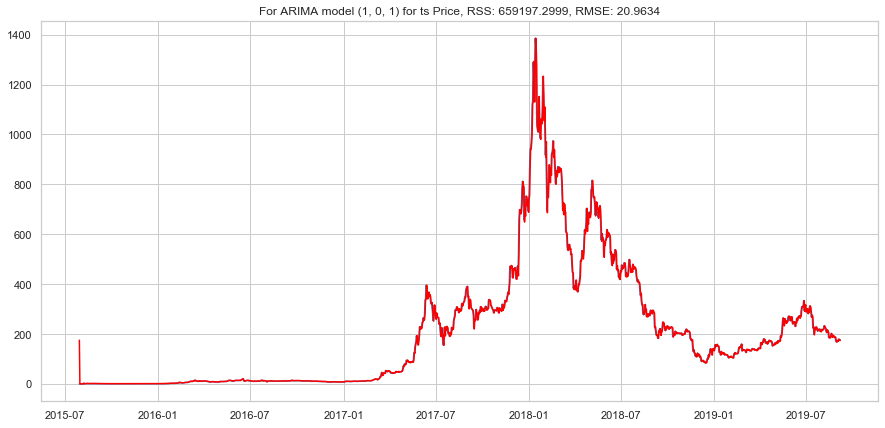

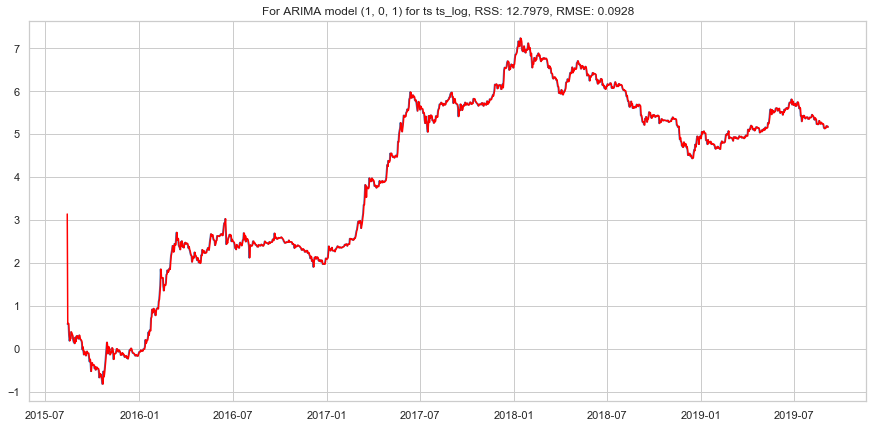

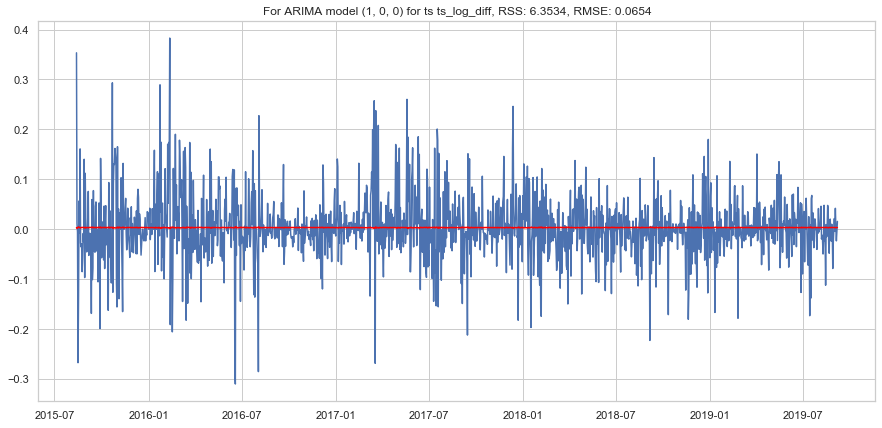

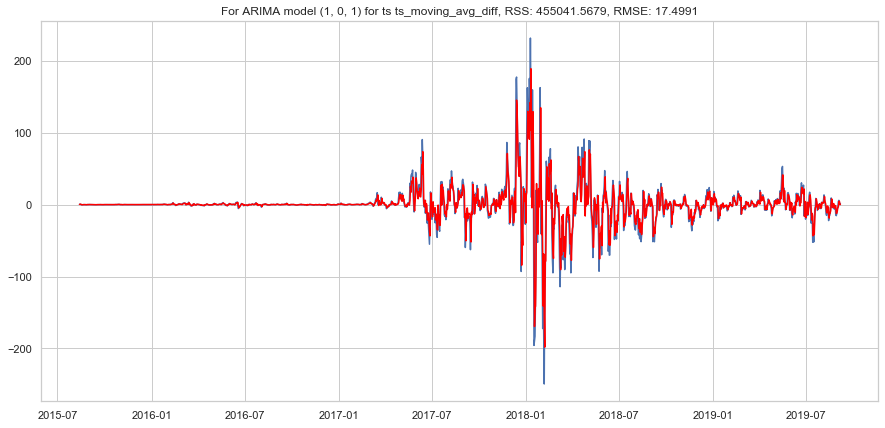

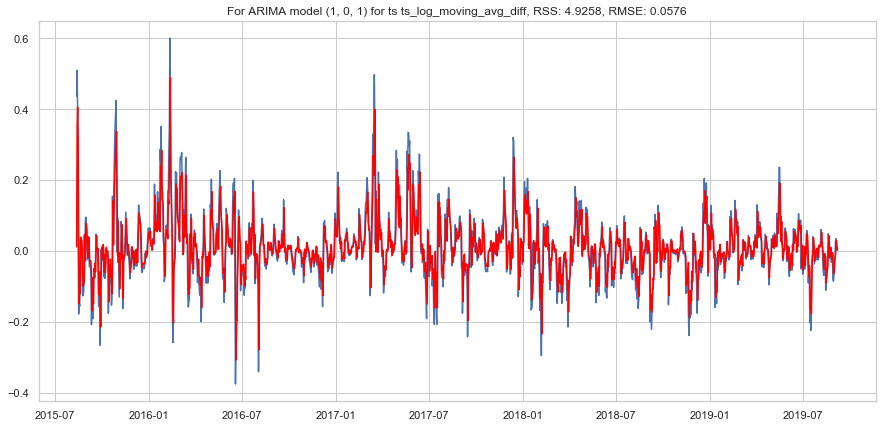

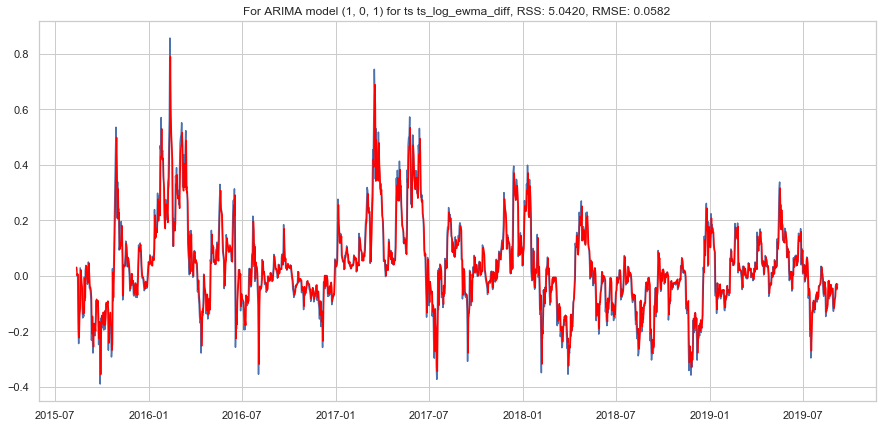

In [49]:
#No transformation
model_price = run_arima_model(df = etherPrice, 
                           ts = 'Price', 
                           p = 1, 
                           d = 0, 
                           q = 1)


#after transformation


model_ts_log = run_arima_model(df = df_example_transform, 
                           ts = 'ts_log', 
                           p = 1, 
                           d = 0, 
                           q = 1)

model_ts_log_diff = run_arima_model(df = df_example_transform, 
                           ts = 'ts_log_diff', 
                           p = 1, 
                           d = 0, 
                           q = 0)

# supposed to fit the best based on the p_value
model_ts_moving_avg_diff = run_arima_model(df = df_example_transform, 
                           ts = 'ts_moving_avg_diff', 
                           p = 1, 
                           d = 0, 
                           q = 1)

model_ts_log_moving_avg_diff = run_arima_model(df = df_example_transform, 
                           ts = 'ts_log_moving_avg_diff', 
                           p = 1, 
                           d = 0, 
                           q = 1)

model_ts_log_ewma_diff = run_arima_model(df = df_example_transform, 
                           ts = 'ts_log_ewma_diff', 
                           p = 1, 
                           d = 0, 
                           q = 1)



## 4) Model Fitting
### Grid search (Hyperparameter Tuning)

In [50]:
df_selected_features = normalised_TS_features[['Supply','AddressCount','Uncles','BtcPrice']]
df_ads = pd.merge(df_selected_features, etherPrice, on='Date', how='outer')

df_ads.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1500 entries, 2015-07-30 to 2019-09-06
Data columns (total 11 columns):
Supply                    1500 non-null float64
AddressCount              1500 non-null float64
Uncles                    1500 non-null float64
BtcPrice                  1500 non-null float64
Price                     1500 non-null float64
ts_log                    1500 non-null float64
ts_log_moving_avg         1486 non-null float64
ts_moving_avg             1494 non-null float64
ts_log_diff               1492 non-null float64
ts_moving_avg_diff        1494 non-null float64
ts_log_moving_avg_diff    1486 non-null float64
dtypes: float64(11)
memory usage: 140.6 KB


In [51]:
df_ads.tail()

,Supply,AddressCount,Uncles,BtcPrice,Price,ts_log,ts_log_moving_avg,ts_moving_avg,ts_log_diff,ts_moving_avg_diff,ts_log_moving_avg_diff
Date,,,,,,,,,,,
2019-09-02,0.998479,0.996546,0.162944,0.529808,178.76,5.186044,5.160079,174.282857,0.041927,4.477143,0.025965
2019-09-03,0.998857,0.997430,0.140609,0.543579,179.13,5.188112,5.153806,173.134286,0.002068,5.995714,0.034305
2019-09-04,0.999236,0.998217,0.139594,0.541274,175.01,5.164843,5.155448,173.420000,-0.023269,1.590000,0.009395
2019-09-05,0.999619,0.999130,0.155838,0.541207,174.38,5.161237,5.159968,174.195714,-0.003606,0.184286,0.001269
2019-09-06,1.000000,1.000000,0.175635,0.527744,177.13,5.176884,5.167086,175.425714,0.015647,1.704286,0.009798


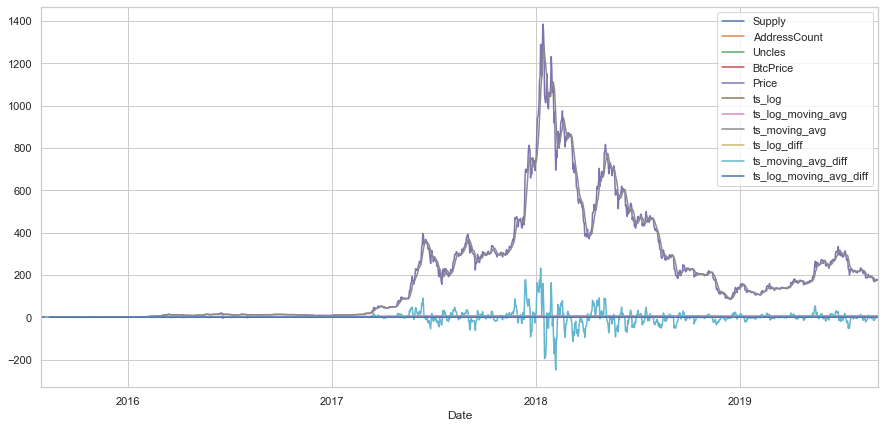

In [52]:
df_ads.plot()

====

# FB Prophet

In [53]:
# fbprophet

from fbprophet import Prophet

df_prophet1 = df_ads
df_prophet1['Date'] = df_ads.index

df_prophet2 = df_ads.rename(columns={"Date": "ds"})
df_prophet = df_prophet2.rename(columns={"Price": "y"})

my_model = Prophet(daily_seasonality=True)
my_model.fit(df_prophet)

In [54]:
future_dates = my_model.make_future_dataframe(periods=365)
future_dates.tail()

,ds
1860,2020-09-01
1861,2020-09-02
1862,2020-09-03
1863,2020-09-04
1864,2020-09-05


In [55]:
forecast = my_model.predict(future_dates)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
1860,2020-09-01,287.444580,-298.751166,899.174708
1861,2020-09-02,285.159402,-308.767436,886.326617
1862,2020-09-03,282.523256,-299.283513,894.558096
1863,2020-09-04,282.586056,-300.856284,889.251236
1864,2020-09-05,284.015153,-296.254161,889.079630


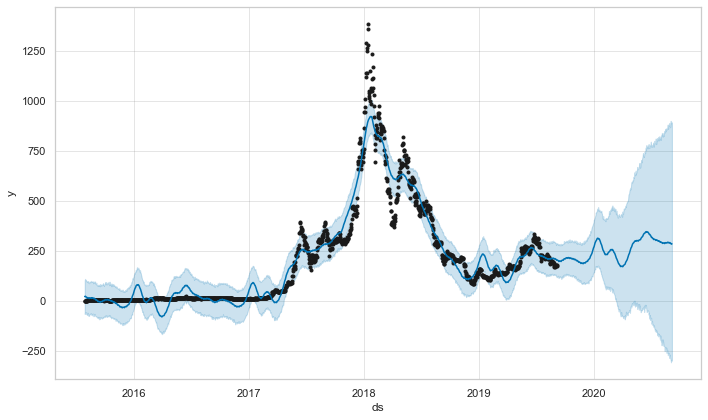

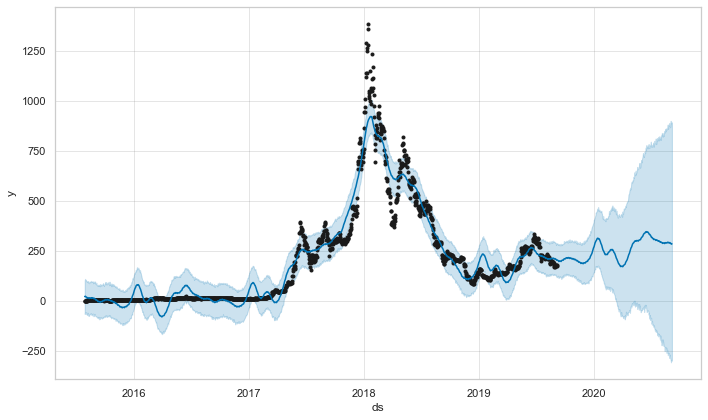

In [56]:
my_model.plot(forecast,uncertainty=True)

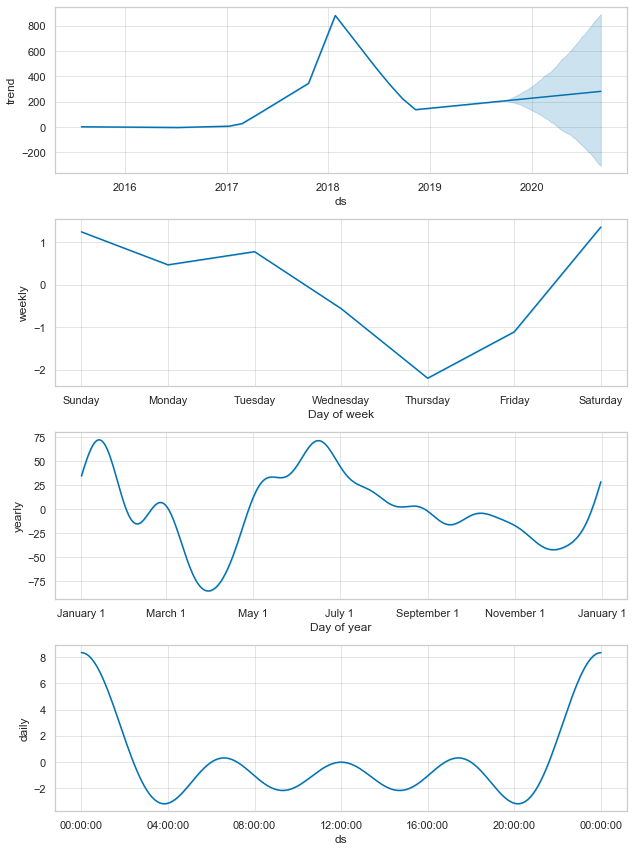

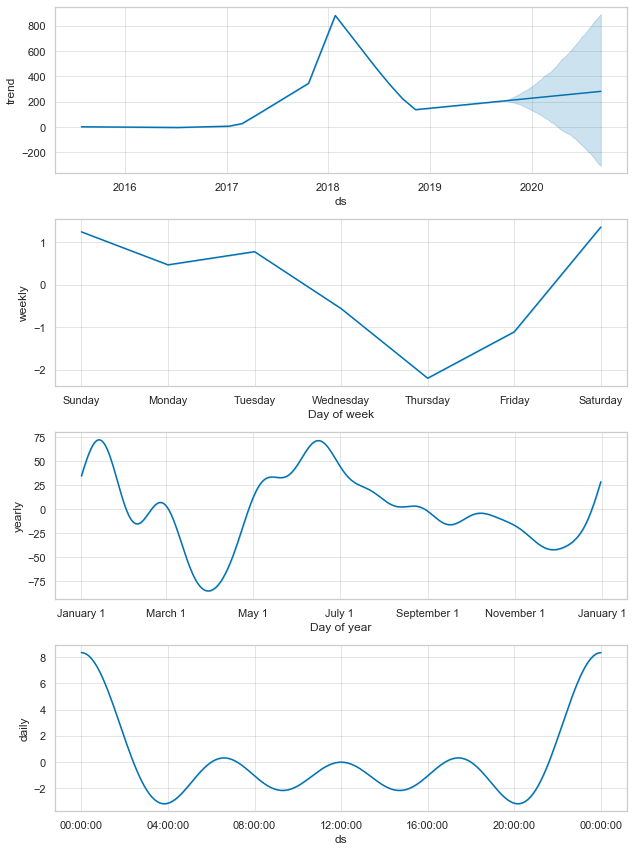

In [57]:
my_model.plot_components(forecast)

In [58]:
forecast.tail(366)

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
1499,2019-09-06,202.645604,117.749247,285.849219,202.645604,202.645604,-0.771806,-0.771806,-0.771806,8.337349,...,-1.106094,-1.106094,-1.106094,-8.003060,-8.003060,-8.003060,0.0,0.0,0.0,201.873798
1500,2019-09-07,202.863032,120.175157,282.936653,202.863032,202.863032,0.460104,0.460104,0.460104,8.337349,...,1.361121,1.361121,1.361121,-9.238366,-9.238366,-9.238366,0.0,0.0,0.0,203.323136
1501,2019-09-08,203.080461,122.240121,286.347923,203.080461,203.080461,-0.846557,-0.846557,-0.846557,8.337349,...,1.247910,1.247910,1.247910,-10.431815,-10.431815,-10.431815,0.0,0.0,0.0,202.233904
1502,2019-09-09,203.297890,119.453451,277.914953,203.297890,203.297890,-2.752194,-2.752194,-2.752194,8.337349,...,0.471718,0.471718,0.471718,-11.561261,-11.561261,-11.561261,0.0,0.0,0.0,200.545696
1503,2019-09-10,203.515318,124.714814,281.842527,203.515318,203.515318,-3.486881,-3.486881,-3.486881,8.337349,...,0.781562,0.781562,0.781562,-12.605791,-12.605791,-12.605791,0.0,0.0,0.0,200.028438
1504,2019-09-11,203.732747,113.318705,283.316209,203.732747,203.732747,-5.767566,-5.767566,-5.767566,8.337349,...,-0.558638,-0.558638,-0.558638,-13.546276,-13.546276,-13.546276,0.0,0.0,0.0,197.965181
1505,2019-09-12,203.950176,118.502546,280.090202,203.950176,203.950176,-8.226099,-8.226099,-8.226099,8.337349,...,-2.197579,-2.197579,-2.197579,-14.365869,-14.365869,-14.365869,0.0,0.0,0.0,195.724076
1506,2019-09-13,204.167604,117.576487,276.748202,204.167604,204.167604,-7.819175,-7.819175,-7.819175,8.337349,...,-1.106094,-1.106094,-1.106094,-15.050430,-15.050430,-15.050430,0.0,0.0,0.0,196.348429
1507,2019-09-14,204.385033,115.213039,283.331174,204.385033,204.385033,-5.890413,-5.890413,-5.890413,8.337349,...,1.361121,1.361121,1.361121,-15.588883,-15.588883,-15.588883,0.0,0.0,0.0,198.494619
1508,2019-09-15,204.602461,121.745177,277.954013,204.602461,204.602461,-6.388226,-6.388226,-6.388226,8.337349,...,1.247910,1.247910,1.247910,-15.973484,-15.973484,-15.973484,0.0,0.0,0.0,198.214236


In [59]:
from fbprophet.plot import plot_plotly
import plotly.offline as py

py.init_notebook_mode()

fig = plot_plotly(my_model, forecast)
py.iplot(fig)

INFO:fbprophet:Making 5 forecasts with cutoffs between 2016-09-16 00:00:00 and 2018-09-06 00:00:00
INFO:fbprophet:Making 5 forecasts with cutoffs between 2016-09-16 00:00:00 and 2018-09-06 00:00:00
INFO:fbprophet:Making 5 forecasts with cutoffs between 2016-09-16 00:00:00 and 2018-09-06 00:00:00
INFO:fbprophet:Making 5 forecasts with cutoffs between 2016-09-16 00:00:00 and 2018-09-06 00:00:00
INFO:fbprophet:Making 5 forecasts with cutoffs between 2016-09-16 00:00:00 and 2018-09-06 00:00:00


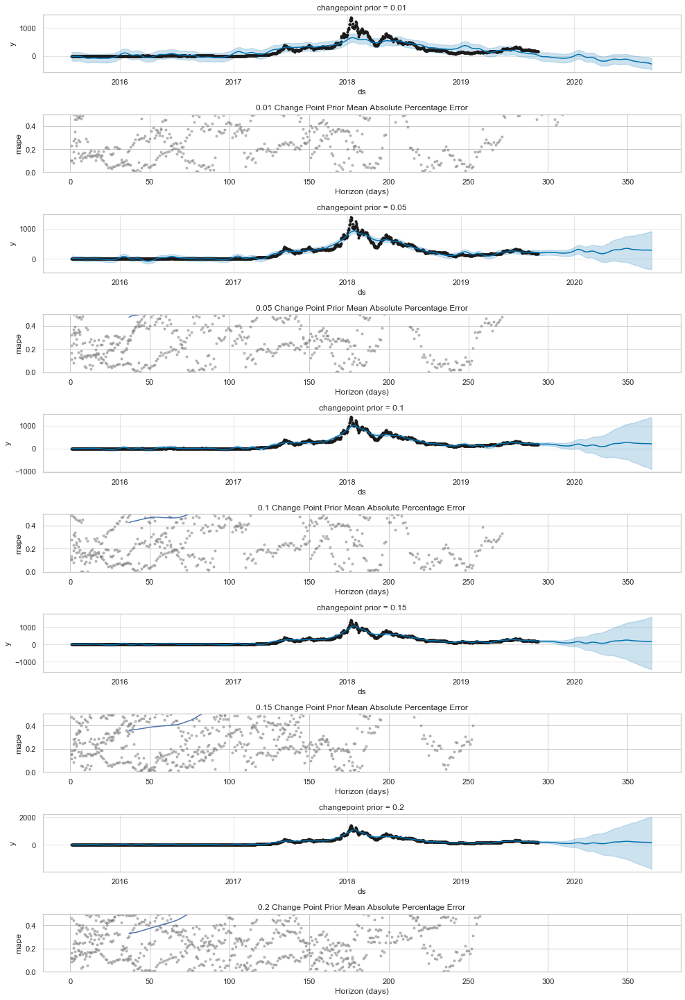

In [60]:
from fbprophet.plot import plot_cross_validation_metric 
from fbprophet.diagnostics import performance_metrics
from fbprophet.diagnostics import cross_validation
pd.plotting.register_matplotlib_converters()

fig, ax = plt.subplots(10,1, figsize = (14, 20))
ax = ax.ravel()
j = 0
for i in [0.01, 0.05, 0.10, 0.15, 0.20]:
    RUT2 = df_ads.rename(columns = {'Date' : 'ds', 'Price' : 'y'} )
    m = Prophet(changepoint_prior_scale=i,daily_seasonality=True)
    #fit the prophet model on the data
    m.fit(RUT2)
    # make a dataframe of the next two years 
    future = m.make_future_dataframe(periods=365)
    #predict on this future dataframe
    forecast = m.predict(future)
    # plot the forecast 
    fig = m.plot(forecast, ax = ax[j])
    ax[j].set_title('changepoint prior = ' + str(i))
    j += 1
    df_cv = cross_validation(m, initial='370 days', period='180 days', horizon = '365 days')
    df_p = performance_metrics(df_cv)
    fig = plot_cross_validation_metric(df_cv, metric='mape', ax = ax[j])
    ax[j].set_title(str(str(i) + ' Change Point Prior Mean Absolute Percentage Error'))
    ax[j].set_ylim(0,0.5)
    j += 1

=-=-=-=-=-=-=-=-

# ARIMA

Dickey–Fuller test: p=0.254807


<Figure size 1080x504 with 0 Axes>

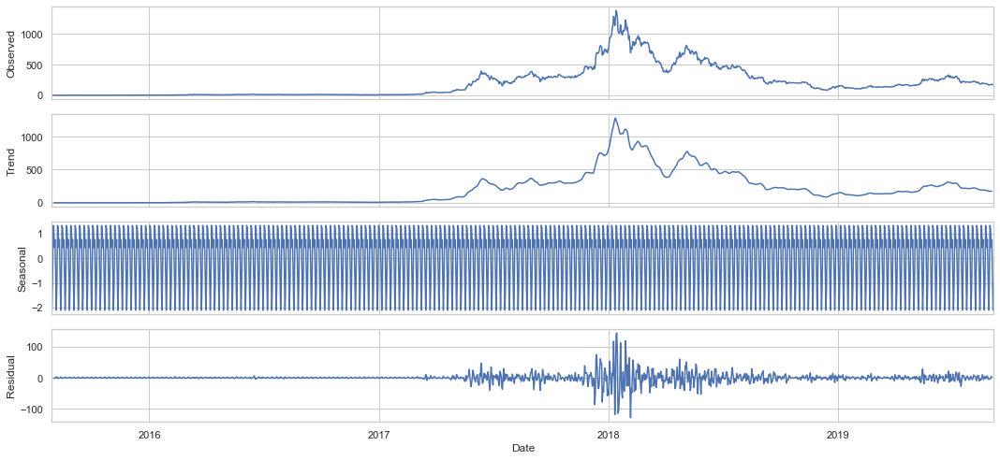

In [61]:
# Stationarity check and STL-decomposition of the series

from scipy import stats
import statsmodels.api as sm
from itertools import product

plt.figure(figsize=[15,7])
sm.tsa.seasonal_decompose(df_ads.Price).plot()
print("Dickey–Fuller test: p=%f" % sm.tsa.stattools.adfuller(df_ads.Price)[1])
plt.show()

In [62]:
# Box-Cox Transformations

#(df_ads.Price == 0).sum() # = 8

df_boxcox = df_ads[df_ads['Price'] != 0]
df_boxcox['Price_box'], lmbda = stats.boxcox(df_boxcox.Price)
print("Dickey–Fuller test: p=%f" % sm.tsa.stattools.adfuller(df_boxcox.Price)[1])

Dickey–Fuller test: p=0.255222


In [63]:
# Seasonal differentiation

df_boxcox['prices_box_diff'] = df_boxcox.Price_box - df_boxcox.Price_box.shift(12)
print("Dickey–Fuller test: p=%f" % sm.tsa.stattools.adfuller(df_boxcox.prices_box_diff[12:])[1])

Dickey–Fuller test: p=0.000001


Dickey–Fuller test: p=0.000000


<Figure size 1080x504 with 0 Axes>

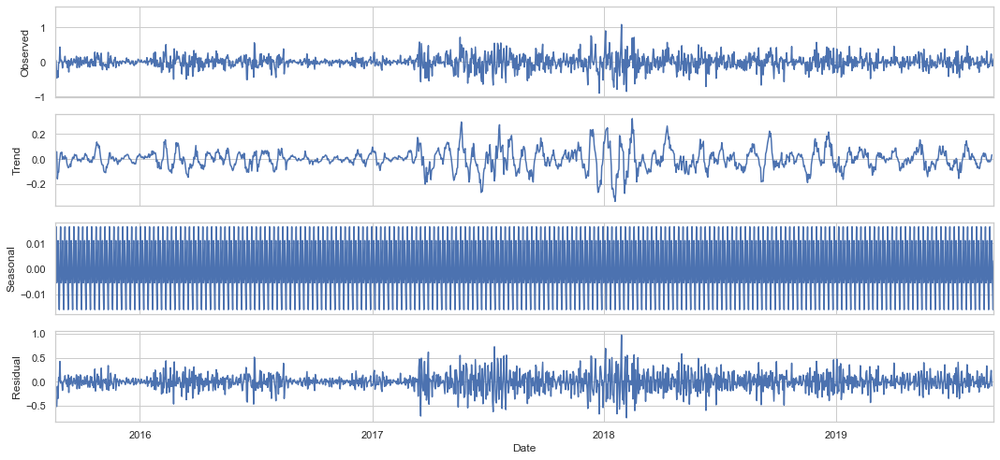

In [64]:
# Regular differentiation

df_boxcox['prices_box_diff2'] = df_boxcox.prices_box_diff - df_boxcox.prices_box_diff.shift(1)
plt.figure(figsize=(15,7))

# STL-decomposition
sm.tsa.seasonal_decompose(df_boxcox.prices_box_diff2[13:]).plot()   
print("Dickey–Fuller test: p=%f" % sm.tsa.stattools.adfuller(df_boxcox.prices_box_diff2[13:])[1])

plt.show()

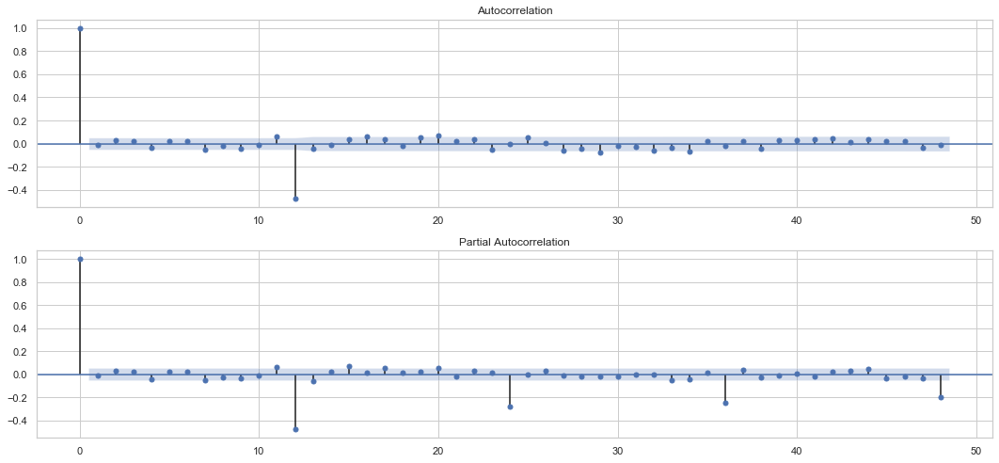

In [65]:
# ARIMA Model Selection

# Initial approximation of parameters using Autocorrelation and Partial Autocorrelation Plots
plt.figure(figsize=(15,7))
ax = plt.subplot(211)
sm.graphics.tsa.plot_acf(df_boxcox.prices_box_diff2[13:].values.squeeze(), lags=48, ax=ax)
ax = plt.subplot(212)
sm.graphics.tsa.plot_pacf(df_boxcox.prices_box_diff2[13:].values.squeeze(), lags=48, ax=ax)
plt.tight_layout()
plt.show()

In [66]:
# Initial approximation of parameters
Qs = range(0, 2)
qs = range(0, 3)
Ps = range(0, 3)
ps = range(0, 3)
D=1
d=1
parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)
len(parameters_list)

# Model Selection
results = []
best_aic = float("inf")
warnings.filterwarnings('ignore')

model = None
for param in parameters_list:
    try:
        model=sm.tsa.statespace.SARIMAX(df_boxcox.Price_box, order=(param[0], d, param[1]), 
                                        seasonal_order=(param[2], D, param[3], 12)).fit(disp=-1)
    except ValueError:
        print('wrong parameters:', param)
        continue
    aic = model.aic
    if aic < best_aic:
        best_model = model
        best_aic = aic
        best_param = param
    results.append([param, model.aic])
    model = best_model
print(results)

[[(0, 0, 0, 0), -472.96302154620366], [(0, 0, 0, 1), -1398.586230134821], [(0, 0, 1, 0), -865.717356441429], [(0, 0, 1, 1), -1396.7016765872804], [(0, 0, 2, 0), -1015.5196350975996], [(0, 0, 2, 1), -1394.619289606741], [(0, 1, 0, 0), -471.1427206567499], [(0, 1, 0, 1), -1396.6973822183077], [(0, 1, 1, 0), -863.8843387164993], [(0, 1, 1, 1), -1394.729071442146], [(0, 1, 2, 0), -1013.6794845684171], [(0, 1, 2, 1), -1392.7693553753488], [(0, 2, 0, 0), -470.41334317507375], [(0, 2, 0, 1), -1398.4535238655508], [(0, 2, 1, 0), -863.3669798674008], [(0, 2, 1, 1), -1396.5643982001316], [(0, 2, 2, 0), -1016.7181322209008], [(0, 2, 2, 1), -1394.7358420760584], [(1, 0, 0, 0), -471.15268564798714], [(1, 0, 0, 1), -1396.6604778738952], [(1, 0, 1, 0), -863.8944520424384], [(1, 0, 1, 1), -1394.7463624117045], [(1, 0, 2, 0), -1013.6974770920157], [(1, 0, 2, 1), -1392.81105052404], [(1, 1, 0, 0), -469.00289781933253], [(1, 1, 0, 1), -1401.938782136869], [(1, 1, 1, 0), -861.7403845247119], [(1, 1, 1, 1)

In [67]:
# Best Models

result_table = pd.DataFrame(results)
result_table.columns = ['parameters', 'aic']
print(result_table.sort_values(by = 'aic', ascending=True).head())
print(best_model.summary())

      parameters          aic
49  (2, 2, 0, 1) -1404.924620
25  (1, 1, 0, 1) -1401.938782
51  (2, 2, 1, 1) -1401.228534
1   (0, 0, 0, 1) -1398.586230
13  (0, 2, 0, 1) -1398.453524
                                 Statespace Model Results                                 
Dep. Variable:                          Price_box   No. Observations:                 1492
Model:             SARIMAX(2, 1, 2)x(0, 1, 1, 12)   Log Likelihood                 708.462
Date:                            Fri, 27 Sep 2019   AIC                          -1404.925
Time:                                    16:51:45   BIC                          -1373.130
Sample:                                08-07-2015   HQIC                         -1393.072
                                     - 09-06-2019                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
-------------

Dickey–Fuller test:: p=0.000000


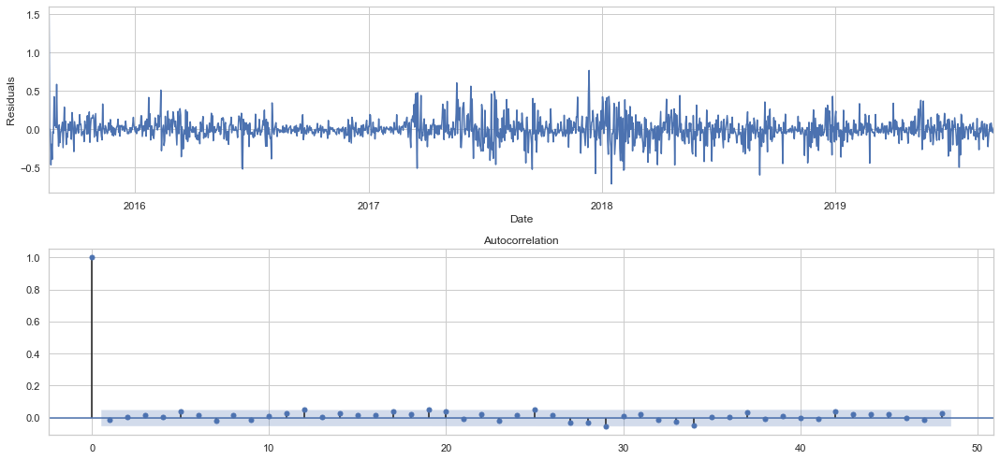

In [69]:
# Analysis of residues

# STL-decomposition
plt.figure(figsize=(15,7))
plt.subplot(211)
best_model.resid[13:].plot()
plt.ylabel(u'Residuals')
ax = plt.subplot(212)
sm.graphics.tsa.plot_acf(best_model.resid[13:].values.squeeze(), lags=48, ax=ax)

print("Dickey–Fuller test:: p=%f" % sm.tsa.stattools.adfuller(best_model.resid[13:])[1])

plt.tight_layout()
plt.show()

In [70]:
# Prediction

# Inverse Box-Cox Transformation Function
def invboxcox(y,lmbda):
   if lmbda == 0:
      return(np.exp(y))
   else:
      return(np.exp(np.log(lmbda*y+1)/lmbda))

In [71]:
df_ads.index.values

array(['2015-07-30T00:00:00.000000000', '2015-07-31T00:00:00.000000000',
       '2015-08-01T00:00:00.000000000', ...,
       '2019-09-04T00:00:00.000000000', '2019-09-05T00:00:00.000000000',
       '2019-09-06T00:00:00.000000000'], dtype='datetime64[ns]')

In [72]:
from dateutil.parser import parse
from datetime import datetime

war_start = '2019-09-07'
datetime.strptime(war_start, '%Y-%m-%d')
attack_dates = ['7/9/2019', '8/9/2019', '9/9/2019', '10/9/2019', '11/9/2019']
[datetime.strptime(x, '%m/%d/%Y') for x in attack_dates]
parse(war_start)
[parse(x) for x in attack_dates]
parse(war_start, dayfirst=True)
data = {'date': ['2019-09-07 0:0:0.0', '2019-09-08 0:0:0.0', '2019-09-09 0:0:0.0', '2019-09-10 0:0:0.0', '2019-09-11 0:0:0.0', '2019-09-12 0:0:0.0', '2019-09-13 0:0:0.0', '2019-09-14 0:0:0.0', '2019-09-15 0:0:0.0',
                '2019-09-16 0:0:0.0', '2019-09-17 0:0:0.0', '2019-09-18 0:0:0.0', '2019-09-19 0:0:0.0', '2019-09-20 0:0:0.0', '2019-09-21 0:0:0.0', '2019-09-22 0:0:0.0', '2019-09-23 0:0:0.0', '2019-09-24 0:0:0.0',
                '2019-09-25 0:0:0.0', '2019-09-26 0:0:0.0', '2019-09-27 0:0:0.0', '2019-09-28 0:0:0.0', '2019-09-29 0:0:0.0', '2019-09-30 0:0:0.0', '2019-10-01 0:0:0.0', '2019-10-02 0:0:0.0', '2019-10-03 0:0:0.0',
                '2019-10-04 0:0:0.0', '2019-10-05 0:0:0.0', '2019-10-06 0:0:0.0', '2019-10-07 0:0:0.0', '2019-10-08 0:0:0.0', '2019-10-09 0:0:0.0', '2019-10-10 0:0:0.0', '2019-10-11 0:0:0.0', '2019-10-12 0:0:0.0'
                ], 
        'value': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}
df = pd.DataFrame(data, columns = ['date', 'value'])
print(df)

                  date  value
0   2019-09-07 0:0:0.0      1
1   2019-09-08 0:0:0.0      1
2   2019-09-09 0:0:0.0      1
3   2019-09-10 0:0:0.0      1
4   2019-09-11 0:0:0.0      1
5   2019-09-12 0:0:0.0      1
6   2019-09-13 0:0:0.0      1
7   2019-09-14 0:0:0.0      1
8   2019-09-15 0:0:0.0      1
9   2019-09-16 0:0:0.0      1
10  2019-09-17 0:0:0.0      1
11  2019-09-18 0:0:0.0      1
12  2019-09-19 0:0:0.0      1
13  2019-09-20 0:0:0.0      1
14  2019-09-21 0:0:0.0      1
15  2019-09-22 0:0:0.0      1
16  2019-09-23 0:0:0.0      1
17  2019-09-24 0:0:0.0      1
18  2019-09-25 0:0:0.0      1
19  2019-09-26 0:0:0.0      1
20  2019-09-27 0:0:0.0      1
21  2019-09-28 0:0:0.0      1
22  2019-09-29 0:0:0.0      1
23  2019-09-30 0:0:0.0      1
24  2019-10-01 0:0:0.0      1
25  2019-10-02 0:0:0.0      1
26  2019-10-03 0:0:0.0      1
27  2019-10-04 0:0:0.0      1
28  2019-10-05 0:0:0.0      1
29  2019-10-06 0:0:0.0      1
30  2019-10-07 0:0:0.0      1
31  2019-10-08 0:0:0.0      1
32  2019-1

In [73]:
expected_dates = np.array(pd.to_datetime(df['date']))
expected_dates

array(['2019-09-07T00:00:00.000000000', '2019-09-08T00:00:00.000000000',
       '2019-09-09T00:00:00.000000000', '2019-09-10T00:00:00.000000000',
       '2019-09-11T00:00:00.000000000', '2019-09-12T00:00:00.000000000',
       '2019-09-13T00:00:00.000000000', '2019-09-14T00:00:00.000000000',
       '2019-09-15T00:00:00.000000000', '2019-09-16T00:00:00.000000000',
       '2019-09-17T00:00:00.000000000', '2019-09-18T00:00:00.000000000',
       '2019-09-19T00:00:00.000000000', '2019-09-20T00:00:00.000000000',
       '2019-09-21T00:00:00.000000000', '2019-09-22T00:00:00.000000000',
       '2019-09-23T00:00:00.000000000', '2019-09-24T00:00:00.000000000',
       '2019-09-25T00:00:00.000000000', '2019-09-26T00:00:00.000000000',
       '2019-09-27T00:00:00.000000000', '2019-09-28T00:00:00.000000000',
       '2019-09-29T00:00:00.000000000', '2019-09-30T00:00:00.000000000',
       '2019-10-01T00:00:00.000000000', '2019-10-02T00:00:00.000000000',
       '2019-10-03T00:00:00.000000000', '2019-10-04

In [74]:
df_arima = df_boxcox[['Price']]

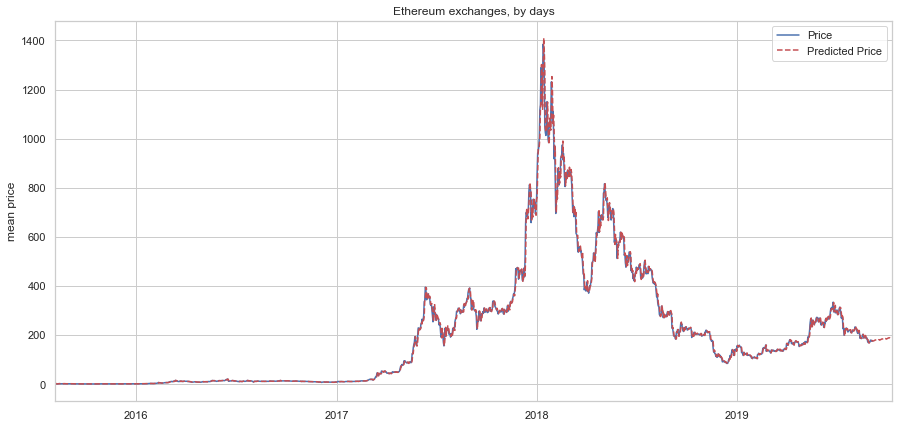

In [75]:
future = pd.DataFrame(index=expected_dates, columns= df_boxcox.columns)
df_arima = pd.concat([df_arima, future])
df_arima['forecast'] = invboxcox(best_model.predict(start=0, end=1600), lmbda)
plt.figure(figsize=(15,7))
df_arima.Price.plot()
df_arima.forecast.plot(color='r', ls='--', label='Predicted Price')
plt.legend()
plt.title('Ethereum exchanges, by days')
plt.ylabel('mean price')
plt.show()

In [76]:
df_arima.loc['2019-09-05':'2019-09-26', :]

,AddressCount,BtcPrice,Date,Price,Price_box,Supply,Uncles,prices_box_diff,prices_box_diff2,ts_log,ts_log_diff,ts_log_moving_avg,ts_log_moving_avg_diff,ts_moving_avg,ts_moving_avg_diff,forecast
2019-09-05,NaN,NaN,NaN,174.38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,177.302825
2019-09-06,NaN,NaN,NaN,177.13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,175.504483
2019-09-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,175.257587
2019-09-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,176.144362
2019-09-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,177.040019
2019-09-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,178.678455
2019-09-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,179.971491
2019-09-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,179.627388
2019-09-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,179.910585
2019-09-14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,180.256839


ANOTHER ARIMA METHOD

In [ ]:
# ARIMA

import warnings
from statsmodels.tsa.arima_model import ARIMA
from sklearn.metrics import mean_squared_error

# evaluate an ARIMA model for a given order (p,d,q)
def evaluate_arima_model(X, arima_order):
    # prepare training dataset
    train_size = int(len(X) * 0.66)
    train, test = X[0:train_size], X[train_size:]
    history = [x for x in train]
    # make predictions
    predictions = list()
    for t in range(len(test)):
        model = ARIMA(history, order=arima_order)
        model_fit = model.fit(disp=0)
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test[t])
    # calculate out of sample error
    error = mean_squared_error(test, predictions)
    return error

# evaluate combinations of p, d and q values for an ARIMA model
def evaluate_models(dataset, p_values, d_values, q_values):
    dataset = dataset.astype('float32')
    best_score, best_cfg = float("inf"), None
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q)
                try:
                    mse = evaluate_arima_model(dataset, order)
                    if mse < best_score:
                        best_score, best_cfg = mse, order
                    print('ARIMA%s MSE=%.3f' % (order,mse))
                except:
                    continue
    print('Best ARIMA%s MSE=%.3f' % (best_cfg, best_score))

# evaluate parameters
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")

evaluate_models(df_ads['Price'].values, p_values, d_values, q_values)

ARIMA(0, 0, 0) MSE=35327.990
ARIMA(0, 0, 1) MSE=10114.725
ARIMA(0, 1, 0) MSE=249.427
ARIMA(0, 1, 1) MSE=254.316
ARIMA(0, 1, 2) MSE=257.872
ARIMA(0, 2, 0) MSE=540.880
ARIMA(0, 2, 1) MSE=250.020
ARIMA(0, 2, 2) MSE=254.966
ARIMA(1, 0, 0) MSE=247.974
ARIMA(1, 0, 1) MSE=253.057
ARIMA(1, 0, 2) MSE=256.410
ARIMA(1, 1, 0) MSE=253.567
ARIMA(1, 1, 1) MSE=255.386


In [ ]:
# Experimental Test-setup
from statsmodels.tsa.arima_model import ARIMA
from sklearn.metrics import mean_squared_error
from matplotlib import pyplot
from math import sqrt

# split into train (first 2 years) and test sets (last year)
X = df_ads['Price'].values
train, test = X[0:-365], X[-365:]
history = [x for x in train]
predictions = list()
# walk-forward validation
for t in range(len(test)):
    # fit model
    model = ARIMA(history, order=(4,1,0))
    model_fit = model.fit()

    # one step forecast
    yhat = model_fit.forecast()[0]
    
    # store forecast and ob
    predictions.append(yhat)
    history.append(test[t])

    # evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
print('Test RMSE: %.3f' % rmse)

# plot forecasts against actual outcomes
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
# The “disp” Parameter

# split into train and test sets
X = df_ads['Price'].values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()

# walk-forward validation
for t in range(len(test)):
    # fit model
    model = ARIMA(history, order=(4,1,0))
    model_fit = model.fit(disp=False)
    # one step forecast
    yhat = model_fit.forecast()[0]
    # store forecast and ob
    predictions.append(yhat)
    history.append(test[t])
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
print('Test RMSE: %.3f' % rmse)

In [ ]:
# The “transparams” Parameter

# split into train and test sets
X = df_ads['Price'].values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()

# walk-forward validation
for t in range(len(test)):
    # fit model
    model = ARIMA(history, order=(4,1,0))
    model_fit = model.fit(disp=False, transparams=False)
    # one step forecast
    yhat = model_fit.forecast()[0]
    # store forecast and ob
    predictions.append(yhat)
    history.append(test[t])
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
print('Test RMSE: %.3f' % rmse)

In [ ]:
# The “trend” Parameter

# split into train and test sets
X = df_ads['Price'].values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()

# walk-forward validation
for t in range(len(test)):
    # fit model
    model = ARIMA(history, order=(4,1,0))
    model_fit = model.fit(disp=False, trend='c')
    print(model_fit.params)
    # one step forecast
    yhat = model_fit.forecast()[0]
    # store forecast and ob
    predictions.append(yhat)
    history.append(test[t])
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
print('Test RMSE: %.3f' % rmse)

In [ ]:
# The “solver” Parameter

# split into train and test sets
X = df_ads['Price'].values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
# solvers
solvers = ['lbfgs', 'bfgs', 'newton', 'nm', 'cg', 'ncg', 'powell']
scores = []
for solver in solvers:
    history = [x for x in train]
    predictions = list()
    
    # walk-forward validation
    for t in range(len(test)):
        # fit model
        model = ARIMA(history, order=(4,1,0))
        model_fit = model.fit(disp=False, solver=solver)
        # one step forecast
        yhat = model_fit.forecast()[0]
        # store forecast and ob
        predictions.append(yhat)
        history.append(test[t])
    # evaluate forecasts
    rmse = sqrt(mean_squared_error(test, predictions))
    scores.append(rmse)
    print('Solver=%s, Test RMSE: %.3f' % (solver, rmse))

# plot scores
ticks = [i for i in range(len(solvers))]
pyplot.bar(ticks, scores)
pyplot.xticks(ticks, solvers)
pyplot.show()

=-=-=-=-=-=-=-=-

# LSTM

In [ ]:
# LSTM
df_lstm = df_ads.set_index('Date').copy()


# split data
split_date = '2018-06-25'
data_train = df_lstm.loc[df_lstm.index <= split_date].copy()
data_test = df_lstm.loc[df_lstm.index > split_date].copy()

In [ ]:
data_train.head()

In [ ]:
# Data preprocess
training_set = data_train.values

training_set = training_set.reshape((len(training_set), 5,1))

from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler()
training_set = sc.fit_transform(training_set)
X_train = training_set[0:len(training_set)-1]
y_train = training_set[1:len(training_set)]
X_train = np.reshape(X_train, (len(X_train), 1, 1))

In [ ]:
# Importing the Keras libraries and packages
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
from keras.layers import Activation


model = Sequential()
model.add(LSTM(128,activation="sigmoid",input_shape=(1,1)))
model.add(Dropout(0.2))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(X_train, y_train, epochs=100, batch_size=50, verbose=2)

In [ ]:
model.summary()

In [ ]:
# Making the predictions
test_set = data_test.values
inputs = np.reshape(test_set, (-1, 1))
inputs = sc.transform(inputs)
inputs = np.reshape(inputs, (len(inputs), 1, 1))
predicted_ETH_price = model.predict(inputs)
predicted_ETH_price = sc.inverse_transform(predicted_ETH_price)

In [ ]:
data_test['Weighted_Price_Prediction'] = predicted_ETH_price
data_all = pd.concat([data_test, data_train], sort=False)

In [ ]:
#saving the predicted values in a common data frame for future comparision
final_data = data_all
final_data = final_data.reset_index()
final_data = final_data.rename(columns={'Price': 'lstm'})
final_data = final_data[['Date','Price','lstm']]
final_data.head()

In [ ]:
mean_absolute_error(y_true=data_test['Price'],
                   y_pred=data_test['Weighted_Price_Prediction'])

=-=-=-=-=-=-=-=-

# Holt Winter’s Exponential Smoothing (HWES) 

In [ ]:
# HWES example
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from random import random
# contrived dataset
data = [x + random() for x in range(1, 100)]
# fit model
model = ExponentialSmoothing(data)
model_fit = model.fit()
# make prediction
yhat_HWES = model_fit.predict(len(data), len(data))
print(yhat_HWES)


forecast_HWES = my_model.predict(future_dates)
forecast_HWES['yhat'].tail()
my_model.plot(forecast_HWES,uncertainty=True)

=-=-=-=-=-=-=-=-  =-=-=-=-=-=-=-=-  =-=-=-=-=-=-=-=-  =-=-=-=-=-=-=-=-   =-=-=-=-=-=-=-=-

In [ ]:
# cross validation
df_cross = df_ads.set_index('Date').copy()

from sklearn import preprocessing
X=df_cross.drop('Price',axis=1)
X=preprocessing.scale(X)#We need to scale our values to input them in our model
y=df_cross['Price']

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=101)

In [ ]:
# RandomForestRegressor
from sklearn.ensemble import RandomForestRegressor
reg=RandomForestRegressor(n_estimators=200,random_state=101)
reg.fit(X_train,y_train)
accuracy=reg.score(X_test,y_test)
accuracy=accuracy*100
accuracy = float("{0:.4f}".format(accuracy))
print('Accuracy is:',accuracy,'%')#This percentage shows how much our regression fits our data

In [ ]:
preds = reg.predict(X_test)
print("The prediction is:",preds[1],"But the real value is:" ,y_test[1])

In [ ]:
#Apply our model and get our prediction
X_30=X[-30:]#We'll take the last 30 elements to make our predictions on them
forecast=reg.predict(X_30)

In [ ]:
#creating a new column which contains the predictions! 
#Proceed at your own risk!  
from datetime import datetime, timedelta
last_date=df_cross.iloc[-1].name
modified_date = last_date + timedelta(days=1)
date=pd.date_range(modified_date,periods=30,freq='D')
df1=pd.DataFrame(forecast,columns=['Forecast'],index=date)
df_cross=df_cross.append(df1)
df_cross['Forecast'].tail()

In [ ]:
#Now we'll plot our forecast! 
pd.plotting.register_matplotlib_converters() #prophet: https://darektidwell.com/typeerror-float-argument-must-be-a-string-or-a-number-not-period-facebook-prophet-and-pandas/
df_cross['Price'].plot(figsize=(12,6),label='Price')
df_cross['Forecast'].plot(label='forecast')
plt.legend()

=-=-=-=-=-=-=-=-

### Data Split train and test

## 5) Evaluation
### Some evaluation methods

In [ ]:
### LSTM
from sklearn.preprocessing import MinMaxScaler

In [ ]:
one_day = 1
one_week = 7
two_weeks = 15
one_month = 30
quater = 120
year = 365

dataset_train = df_data[:-one_month].copy()
training_set = dataset_train.iloc[:, -1:].values


#Feature Scaling
sc = MinMaxScaler(feature_range=(0,1))
training_set_scaled = sc.fit_transform(training_set)

# Creating a data structure with 30 timestamps and 1 output

X_train = []
y_train = []
useData = 50

for i in range(useData,len(training_set_scaled)):
    X_train.append(training_set_scaled[i-useData:i,0])
    y_train.append(training_set_scaled[i, 0])
X_train, y_train = np.array(X_train), np.array(y_train)

# Reshape for folfilling the Keras Layers --> 3 Dimensionen (all data, steps (useData),)
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1],1))


In [ ]:
# Part 2 - Buling the RNN

# Importing the Keras libaries and packages
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout

# Neuronce per layer --> we could expirement with that
first_layer = 50
second_layer = 50
third_layer = 50
fourth_layer = 50


# Initialisingt the RNN
regressor = Sequential()

# Adding the first LSTM Layer and some Droput regularisation
regressor.add(LSTM(units = first_layer, return_sequences = True, input_shape = (X_train.shape[1],1)))
regressor.add(Dropout(0.2))

# Adding the second LSTM Layer and some Droput regularisation
regressor.add(LSTM(units = second_layer, return_sequences = True))
regressor.add(Dropout(0.2))

# Adding the third LSTM Layer and some Droput regularisation
regressor.add(LSTM(units = third_layer, return_sequences = True))
regressor.add(Dropout(0.2))

# Adding the fourth LSTM Layer and some Droput regularisation
regressor.add(LSTM(units = fourth_layer))
regressor.add(Dropout(0.2))

# Adding outputlayer
regressor.add(Dense(units=1))

# Compiling the RNN
regressor.compile(optimizer = 'adam', loss = 'mean_squared_error')

# Fitting the RNN to the Training set
# epochs is how often it runs to reduce the loss
regressor.fit(X_train, y_train,epochs = 50, batch_size=32)

In [ ]:
# Part 3 - Making the predictions and visualising the results


# Getting prices for the set intervall (one_Day, one_week ..)
dataset_test = df_data[-one_month:].copy()
test_set = dataset_test.iloc[:, -1:].values


# Getting the predictet stockprice for intervall (one_Day, one_week ..)
dataset_total = pd.concat((dataset_train["Price"], dataset_test["Price"]), axis=0)
inputs = dataset_total[len(dataset_total)-len(dataset_test)-useData:].values
inputs = inputs.reshape(-1,1)
inputs = sc.transform(inputs)
X_test = []
for i in range(useData,useData+one_month):
    X_test.append(inputs[i-useData:i,0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
predicted_eth_price = regressor.predict(X_test)
predicted_eth_price = sc.inverse_transform(predicted_eth_price) # --> invers transform the Normalisation


In [ ]:
# Ploting my results

plt.plot(test_set, color = 'red', label = 'Real ETH Price')
#plt.plot(training_set[:-one_month], color = "green", label = 'ETH Test')
plt.plot(predicted_eth_price, color = 'blue', label = 'Predictet ETH Price')
plt.title('ETH Price Prediction')
plt.xlabel('Time')
plt.ylabel('ETH Price')
plt.legend()
plt.show()

In [ ]:
# Training and test sets
# time series cross validation
# timeframes for testing the models

# one day df_data_train[:-1] df_data_test[-1:] 
# one week df_data_train[:-7] df_data_test[-7:] 
# two weeks df_data_train[:-14] df_data_test[-14:] 
# one month df_data_train[:-30] df_data_test[-30:] 
# one quater df_data_train[:-120] df_data_test[-120:] 
# one year df_data_train[:-360] df_data_test[-360:] 


# Forcast Error
# e = y - ^y (to given time)
error = test_set-predicted_eth_price
print("Mean Error ETH LSTM forcast: "+str(error.mean()))


# Scale dependen Errors
# Mean absolute Error (i think it is the above one...) MAE = mean(|error|)
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.mean_absolute_error.html
from sklearn.metrics import mean_absolute_error

print("MSE LSTM: " + str(mean_absolute_error(test_set, predicted_eth_price)))


# Root mean square error RMSE= sqrt(mean(e^2 of t)) no clue how to calclulate that
from sklearn.metrics import mean_squared_error
from math import sqrt

rms = sqrt(mean_squared_error(test_set, predicted_eth_price))

print("RMSE LSTM: " + str(rms))



# Percentage errors
# from https://stats.stackexchange.com/questions/58391/mean-absolute-percentage-error-mape-in-scikit-learn/294069#294069

def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

print("MAPE LSTM: "+str(mean_absolute_percentage_error(test_set,predicted_eth_price)))



# Scaled errors
# MASE copied from : https://github.com/CamDavidsonPilon/Python-Numerics/blob/master/TimeSeries/MASE.py
      
def MASE(training_series, testing_series, prediction_series):
    """
    Computes the MEAN-ABSOLUTE SCALED ERROR forcast error for univariate time series prediction.
    
    See "Another look at measures of forecast accuracy", Rob J Hyndman
    
    parameters:
        training_series: the series used to train the model, 1d numpy array
        testing_series: the test series to predict, 1d numpy array or float
        prediction_series: the prediction of testing_series, 1d numpy array (same size as testing_series) or float
        absolute: "squares" to use sum of squares and root the result, "absolute" to use absolute values.
    
    """
    print ("Needs to be tested.")
    n = training_series.shape[0]
    d = np.abs(  np.diff( training_series) ).sum()/(n-1)
    
    errors = np.abs(testing_series - prediction_series )
    return errors.mean()/d

print("MASE LSTM:" + str(MASE(training_set,test_set,predicted_eth_price))) # Somhow it is not working

In [ ]:
def MASE(training_series, testing_series, prediction_series):
    """
    Computes the MEAN-ABSOLUTE SCALED ERROR forcast error for univariate time series prediction.
    
    See "Another look at measures of forecast accuracy", Rob J Hyndman
    
    parameters:
        training_series: the series used to train the model, 1d numpy array
        testing_series: the test series to predict, 1d numpy array or float
        prediction_series: the prediction of testing_series, 1d numpy array (same size as testing_series) or float
        absolute: "squares" to use sum of squares and root the result, "absolute" to use absolute values.
    
    """
    print ("Needs to be tested.")
    n = training_series.shape[0]
    d = np.abs(  np.diff( training_series) ).sum()/(n-1)
    
    errors = np.abs(testing_series - prediction_series )
    return errors.mean()/d

##### Evaluation plots and data comparison

In [ ]:
print("Shape Training: " +str(training_set.shape))
print("Shape Test: " +str(test_set.shape))
print("Shape Pred: " +str(predicted_eth_price.shape))

In [ ]:
training_set

### Evaluation plots and data comparison

### Conclusion